### Unzip dataset

In [1]:
!unzip dataset/archive.zip

Archive:  dataset/archive.zip
  inflating: README.txt              
  inflating: experiment_01.csv       
  inflating: experiment_02.csv       
  inflating: experiment_03.csv       
  inflating: experiment_04.csv       
  inflating: experiment_05.csv       
  inflating: experiment_06.csv       
  inflating: experiment_07.csv       
  inflating: experiment_08.csv       
  inflating: experiment_09.csv       
  inflating: experiment_10.csv       
  inflating: experiment_11.csv       
  inflating: experiment_12.csv       
  inflating: experiment_13.csv       
  inflating: experiment_14.csv       
  inflating: experiment_15.csv       
  inflating: experiment_16.csv       
  inflating: experiment_17.csv       
  inflating: experiment_18.csv       
  inflating: test_artifact.jpg       
  inflating: train.csv               


### Import packages

In [1]:
%config InlineBackend.figure_formats = ['retina']

from collections import OrderedDict

import pandas as pd
import numpy as np

# see https://ipython.readthedocs.io/en/stable/interactive/magics.html
%pylab inline

# sets backend to render higher res images
%config InlineBackend.figure_formats = ['retina']

import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, fbeta_score, roc_auc_score, accuracy_score, roc_curve, auc, log_loss 
from sklearn.metrics import precision_score, recall_score, precision_recall_curve, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score, cross_val_predict

import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

Populating the interactive namespace from numpy and matplotlib


In [2]:
exp_frame = []
experiment_name = []
rows = []
cols = []
tool_conds = []

# train.csv contains sample material and output of the experiment
output = pd.read_csv("train.csv")

for i in range(1,19):
    exp_no = '0' + str(i) if i < 10 else str(i)
    exp_id = "experiment_{}.csv".format(exp_no)
    frame = pd.read_csv("experiment_{}.csv".format(exp_no))

    nrows = frame.shape[0] 
    ncols = frame.shape[1]
    experiment_name.append(exp_id)
    rows.append(nrows)
    cols.append(ncols)
    
    row = output[output['No'] == i]
    tool_cond = row.iloc[0]['tool_condition']
    
    tool_conds.append(tool_cond)
    
    frame['exp_number'] = i
    frame['feedrate'] = row.iloc[0]['feedrate']
    frame['clamp_pressure'] = row.iloc[0]['clamp_pressure']
    frame['tool_condition'] = row.iloc[0]['tool_condition']
    frame['output'] = 1 if row.iloc[0]['tool_condition'] == 'worn' else 0
    exp_frame.append(frame)
exp_df = pd.concat(exp_frame, ignore_index = True)

In [3]:
# train.csv contains sample material and output of the experiment
output.head()

,No,material,feedrate,clamp_pressure,tool_condition,machining_finalized,passed_visual_inspection
0,1,wax,6,4.0,unworn,yes,yes
1,2,wax,20,4.0,unworn,yes,yes
2,3,wax,6,3.0,unworn,yes,yes
3,4,wax,6,2.5,unworn,no,NaN
4,5,wax,20,3.0,unworn,no,NaN


In [4]:
# combined dataframe of experiments
exp_df.head()

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,S1_SystemInertia,M1_CURRENT_PROGRAM_NUMBER,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,exp_number,feedrate,clamp_pressure,tool_condition,output
0,198.0,0.0,0.00,198.0,0.0,0.000000,0.18,0.0207,329.0,2.77,...,12.0,1.0,0.0,50.0,Starting,1,6,4.0,unworn,0
1,198.0,-10.8,-350.00,198.0,-13.6,-358.000000,-10.90,0.1860,328.0,23.30,...,12.0,1.0,4.0,50.0,Prep,1,6,4.0,unworn,0
2,196.0,-17.8,-6.25,196.0,-17.9,-0.000095,-8.59,0.1400,328.0,30.60,...,12.0,1.0,7.0,50.0,Prep,1,6,4.0,unworn,0
3,194.0,-18.0,0.00,194.0,-17.9,-0.000095,-6.11,0.1300,327.0,30.30,...,12.0,1.0,7.0,50.0,Prep,1,6,4.0,unworn,0
4,193.0,-17.9,-18.80,192.0,-17.9,0.000095,-5.70,0.1140,328.0,30.50,...,12.0,1.0,7.0,50.0,Prep,1,6,4.0,unworn,0


In [5]:
exp_df.shape

(25286, 53)

### View size and tool condition of each experiment data

In [6]:
dict_exp = {"Experiment_Name": experiment_name,
            "Number_of_Rows": rows,
            "Number_of_Columns": cols,
            "Tool_Condition": tool_conds}
dict_exp_df = pd.DataFrame(dict_exp)
dict_exp_df

,Experiment_Name,Number_of_Rows,Number_of_Columns,Tool_Condition
0,experiment_01.csv,1055,48,unworn
1,experiment_02.csv,1668,48,unworn
2,experiment_03.csv,1521,48,unworn
3,experiment_04.csv,532,48,unworn
4,experiment_05.csv,462,48,unworn
5,experiment_06.csv,1296,48,worn
6,experiment_07.csv,565,48,worn
7,experiment_08.csv,605,48,worn
8,experiment_09.csv,740,48,worn
9,experiment_10.csv,1301,48,worn


### Data Cleaning
Active machining operations are labeled as: 
    "Layer 1 Up", "Layer 1 Down", "Layer 2 Up", "Layer 2 Down", "Layer 3 Up", and "Layer 3 Down". 

Non Active machining modes will not contribute to the wear on a mill tool because the mill tool is not in contact 
with the material that is machined.

Find unique labels and drop rows with inactive machining operations label.

In [7]:
exp_df['Machining_Process'].value_counts().sort_index()

End              2585
Layer 1 Down     2655
Layer 1 Up       4085
Layer 2 Down     2528
Layer 2 Up       3104
Layer 3 Down     2354
Layer 3 Up       2794
Prep             1795
Repositioning    3377
Starting            1
end                 8
Name: Machining_Process, dtype: int64

Drop rows containing Machining_Process "End", "Prep", "Repositioning", "Starting", and "end".

In [8]:
exp_df.drop(exp_df.loc[exp_df['Machining_Process'] == 'End'].index, inplace=True)
exp_df.drop(exp_df.loc[exp_df['Machining_Process'] == 'Prep'].index, inplace=True)
exp_df.drop(exp_df.loc[exp_df['Machining_Process'] == 'Repositioning'].index, inplace=True)
exp_df.drop(exp_df.loc[exp_df['Machining_Process'] == 'Starting'].index, inplace=True)
exp_df.drop(exp_df.loc[exp_df['Machining_Process'] == 'end'].index, inplace=True)

* Note: Some variables will not accurately reflect the operation of the CNC machine. This can usually be detected by when M1_CURRENT_FEEDRATE reads 50, when X1 ActualPosition reads 198, or when M1_CURRENT_PROGRAM_NUMBER does not read 0. The source of these errors has not been identified.

In [9]:
exp_df.drop(exp_df.loc[exp_df['M1_CURRENT_FEEDRATE'] == 50].index, inplace=True)
exp_df.drop(exp_df.loc[exp_df['X1_ActualPosition'] == 198].index, inplace=True)
exp_df = exp_df.drop(['M1_CURRENT_PROGRAM_NUMBER'], axis = 1)
exp_df.shape

(12943, 52)

In [10]:
exp_df['Machining_Process'].value_counts().sort_index()

Layer 1 Down    1940
Layer 1 Up      2822
Layer 2 Down    1859
Layer 2 Up      2443
Layer 3 Down    1859
Layer 3 Up      2020
Name: Machining_Process, dtype: int64

In [11]:
# Reset index
exp_df.index = pd.RangeIndex(len(exp_df.index))
exp_df.index = range(len(exp_df.index))

In [12]:
exp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12943 entries, 0 to 12942
Data columns (total 52 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   X1_ActualPosition       12943 non-null  float64
 1   X1_ActualVelocity       12943 non-null  float64
 2   X1_ActualAcceleration   12943 non-null  float64
 3   X1_CommandPosition      12943 non-null  float64
 4   X1_CommandVelocity      12943 non-null  float64
 5   X1_CommandAcceleration  12943 non-null  float64
 6   X1_CurrentFeedback      12943 non-null  float64
 7   X1_DCBusVoltage         12943 non-null  float64
 8   X1_OutputCurrent        12943 non-null  float64
 9   X1_OutputVoltage        12943 non-null  float64
 10  X1_OutputPower          12943 non-null  float64
 11  Y1_ActualPosition       12943 non-null  float64
 12  Y1_ActualVelocity       12943 non-null  float64
 13  Y1_ActualAcceleration   12943 non-null  float64
 14  Y1_CommandPosition      12943 non-null

In [13]:
exp_df.head()

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,S1_OutputPower,S1_SystemInertia,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,exp_number,feedrate,clamp_pressure,tool_condition,output
0,151.0,0.075,37.50,151.0,0.0,0.0,0.878,0.0377,327.0,1.56,...,0.1500,12.0,12.0,6.0,Layer 1 Up,1,6,4.0,unworn,0
1,151.0,-0.075,-37.50,151.0,0.0,0.0,0.664,0.0332,325.0,4.30,...,0.2310,12.0,14.0,6.0,Layer 1 Up,1,6,4.0,unworn,0
2,151.0,-6.000,6.25,150.0,-6.0,0.0,-8.100,0.0983,323.0,10.20,...,0.3410,12.0,14.0,6.0,Layer 1 Up,1,6,4.0,unworn,0
3,150.0,-6.150,-43.80,150.0,-6.0,0.0,-6.420,0.1010,322.0,11.50,...,0.4410,12.0,14.0,6.0,Layer 1 Up,1,6,4.0,unworn,0
4,149.0,-5.930,62.50,149.0,-6.0,0.0,-6.670,0.0980,325.0,14.20,...,0.0746,12.0,14.0,6.0,Layer 1 Up,1,6,4.0,unworn,0


### EDA and Baselining

* Check for class imbalance

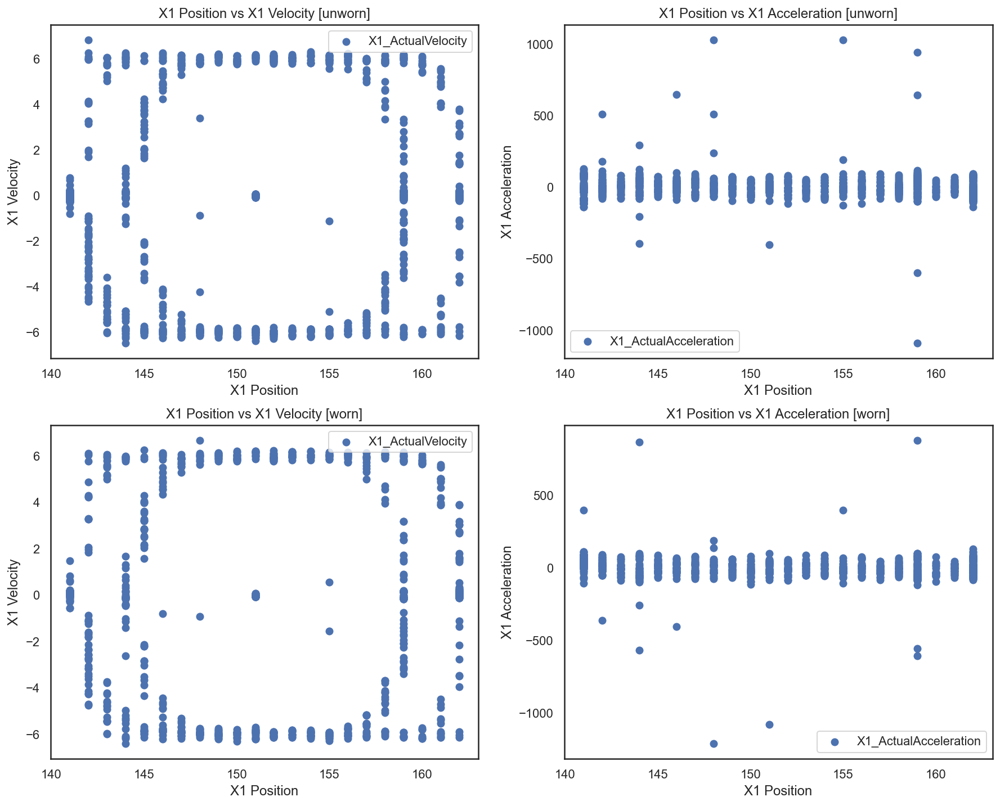

In [14]:
# Analyzing experiment01, tool_condition = unworn

mask1 = (exp_df['exp_number'] == 1)
exp_01 = exp_df[mask1]

sns.set_theme(style='white')
fig, ax = plt.subplots(2,2,figsize=[15,12])
ax[0,0].scatter(exp_01['X1_ActualPosition'],exp_01['X1_ActualVelocity'], label='X1_ActualVelocity')
ax[0,0].set_title('X1 Position vs X1 Velocity [unworn]')
ax[0,0].set_ylabel('X1 Velocity')
ax[0,0].set_xlabel('X1 Position')
ax[0,0].legend()

ax[0,1].scatter(exp_01['X1_ActualPosition'],exp_01['X1_ActualAcceleration'], label='X1_ActualAcceleration')
ax[0,1].set_title('X1 Position vs X1 Acceleration [unworn]')
ax[0,1].set_ylabel('X1 Acceleration')
ax[0,1].set_xlabel('X1 Position')
ax[0,1].legend()

# Analyzing experiment06, tool_condition = worn

mask6 = (exp_df['exp_number'] == 6)
exp_06 = exp_df[mask6]

ax[1,0].scatter(exp_06['X1_ActualPosition'],exp_06['X1_ActualVelocity'], label='X1_ActualVelocity')
ax[1,0].set_title('X1 Position vs X1 Velocity [worn]')
ax[1,0].set_ylabel('X1 Velocity')
ax[1,0].set_xlabel('X1 Position')
ax[1,0].legend()

ax[1,1].scatter(exp_06['X1_ActualPosition'],exp_06['X1_ActualAcceleration'], label='X1_ActualAcceleration')
ax[1,1].set_title('X1 Position vs X1 Acceleration [worn]')
ax[1,1].set_ylabel('X1 Acceleration')
ax[1,1].set_xlabel('X1 Position')
ax[1,1].legend();

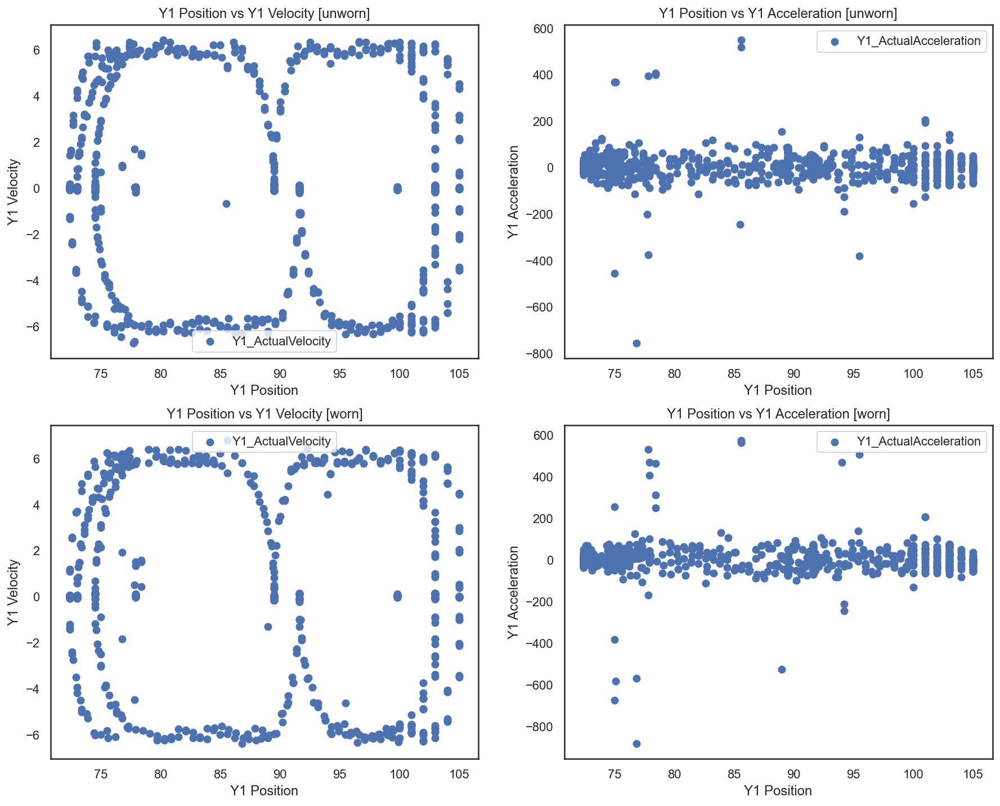

In [15]:
# Analyzing experiment01, tool_condition = unworn

sns.set_theme(style='white')
fig, ax = plt.subplots(2,2,figsize=[15,12])
ax[0,0].scatter(exp_01['Y1_ActualPosition'],exp_01['Y1_ActualVelocity'], label='Y1_ActualVelocity')
ax[0,0].set_title('Y1 Position vs Y1 Velocity [unworn]')
ax[0,0].set_ylabel('Y1 Velocity')
ax[0,0].set_xlabel('Y1 Position')
ax[0,0].legend()

ax[0,1].scatter(exp_01['Y1_ActualPosition'],exp_01['Y1_ActualAcceleration'], label='Y1_ActualAcceleration')
ax[0,1].set_title('Y1 Position vs Y1 Acceleration [unworn]')
ax[0,1].set_ylabel('Y1 Acceleration')
ax[0,1].set_xlabel('Y1 Position')
ax[0,1].legend()

# Analyzing experiment06, tool_condition = worn

ax[1,0].scatter(exp_06['Y1_ActualPosition'],exp_06['Y1_ActualVelocity'], label='Y1_ActualVelocity')
ax[1,0].set_title('Y1 Position vs Y1 Velocity [worn]')
ax[1,0].set_ylabel('Y1 Velocity')
ax[1,0].set_xlabel('Y1 Position')
ax[1,0].legend()

ax[1,1].scatter(exp_06['Y1_ActualPosition'],exp_06['Y1_ActualAcceleration'], label='Y1_ActualAcceleration')
ax[1,1].set_title('Y1 Position vs Y1 Acceleration [worn]')
ax[1,1].set_ylabel('Y1 Acceleration')
ax[1,1].set_xlabel('Y1 Position')
ax[1,1].legend();

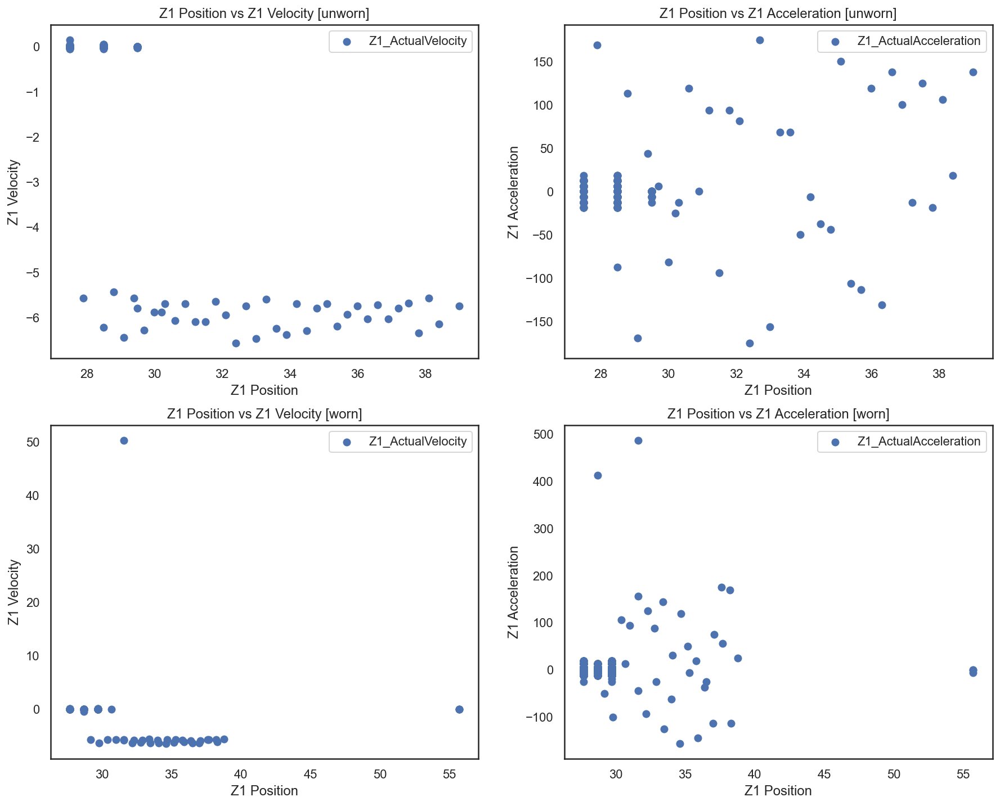

In [16]:
# Analyzing experiment01, tool_condition = unworn

sns.set_theme(style='white')
fig, ax = plt.subplots(2,2,figsize=[15,12])
ax[0,0].scatter(exp_01['Z1_ActualPosition'],exp_01['Z1_ActualVelocity'], label='Z1_ActualVelocity')
ax[0,0].set_title('Z1 Position vs Z1 Velocity [unworn]')
ax[0,0].set_ylabel('Z1 Velocity')
ax[0,0].set_xlabel('Z1 Position')
ax[0,0].legend()

ax[0,1].scatter(exp_01['Z1_ActualPosition'],exp_01['Z1_ActualAcceleration'], label='Z1_ActualAcceleration')
ax[0,1].set_title('Z1 Position vs Z1 Acceleration [unworn]')
ax[0,1].set_ylabel('Z1 Acceleration')
ax[0,1].set_xlabel('Z1 Position')
ax[0,1].legend()

# Analyzing experiment06, tool_condition = worn

ax[1,0].scatter(exp_06['Z1_ActualPosition'],exp_06['Z1_ActualVelocity'], label='Z1_ActualVelocity')
ax[1,0].set_title('Z1 Position vs Z1 Velocity [worn]')
ax[1,0].set_ylabel('Z1 Velocity')
ax[1,0].set_xlabel('Z1 Position')
ax[1,0].legend()

ax[1,1].scatter(exp_06['Z1_ActualPosition'],exp_06['Z1_ActualAcceleration'], label='Z1_ActualAcceleration')
ax[1,1].set_title('Z1 Position vs Z1 Acceleration [worn]')
ax[1,1].set_ylabel('Z1 Acceleration')
ax[1,1].set_xlabel('Z1 Position')
ax[1,1].legend();

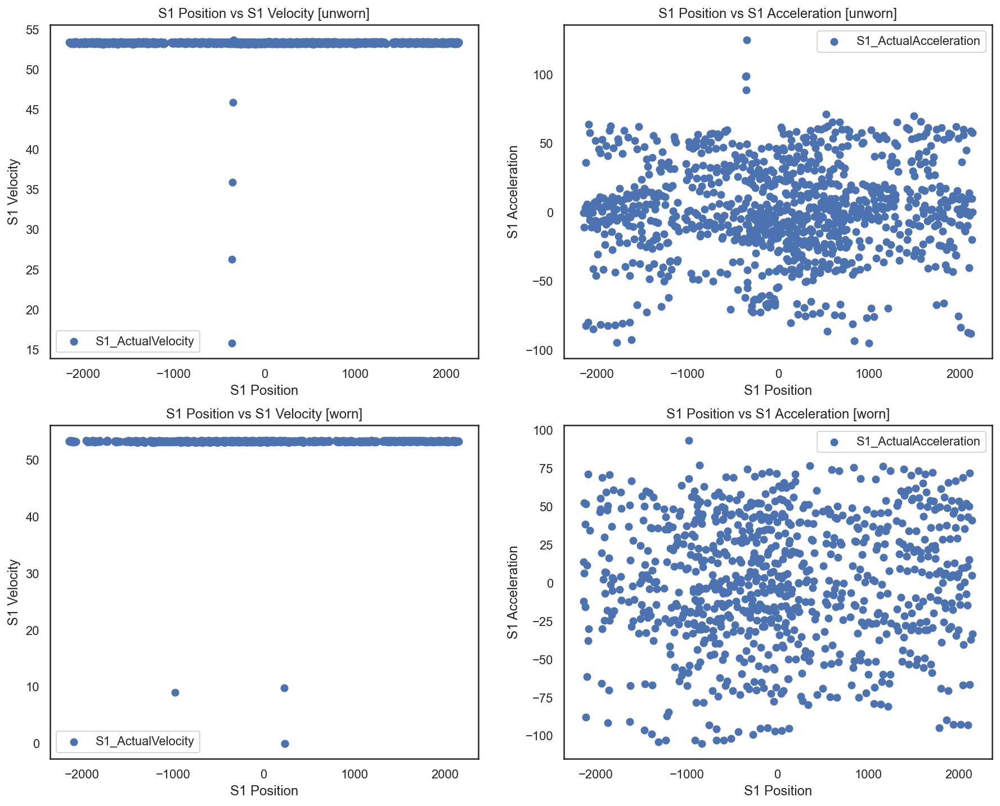

In [17]:
# Analyzing experiment01, tool_condition = unworn

sns.set_theme(style='white')
fig, ax = plt.subplots(2,2,figsize=[15,12])
ax[0,0].scatter(exp_01['S1_ActualPosition'],exp_01['S1_ActualVelocity'], label='S1_ActualVelocity')
ax[0,0].set_title('S1 Position vs S1 Velocity [unworn]')
ax[0,0].set_ylabel('S1 Velocity')
ax[0,0].set_xlabel('S1 Position')
ax[0,0].legend()

ax[0,1].scatter(exp_01['S1_ActualPosition'],exp_01['S1_ActualAcceleration'], label='S1_ActualAcceleration')
ax[0,1].set_title('S1 Position vs S1 Acceleration [unworn]')
ax[0,1].set_ylabel('S1 Acceleration')
ax[0,1].set_xlabel('S1 Position')
ax[0,1].legend()

# Analyzing experiment06, tool_condition = worn

ax[1,0].scatter(exp_06['S1_ActualPosition'],exp_06['S1_ActualVelocity'], label='S1_ActualVelocity')
ax[1,0].set_title('S1 Position vs S1 Velocity [worn]')
ax[1,0].set_ylabel('S1 Velocity')
ax[1,0].set_xlabel('S1 Position')
ax[1,0].legend()

ax[1,1].scatter(exp_06['S1_ActualPosition'],exp_06['S1_ActualAcceleration'], label='S1_ActualAcceleration')
ax[1,1].set_title('S1 Position vs S1 Acceleration [worn]')
ax[1,1].set_ylabel('S1 Acceleration')
ax[1,1].set_xlabel('S1 Position')
ax[1,1].legend();

In [18]:
# Distribution of output

print("Distribution of output: 1 = worn; 0 = unworn:")
dist_output = exp_df['output'].value_counts() 
print(dist_output)

Distribution of output: 1 = worn; 0 = unworn:
1    6982
0    5961
Name: output, dtype: int64


1    0.539442
0    0.460558
Name: output, dtype: float64


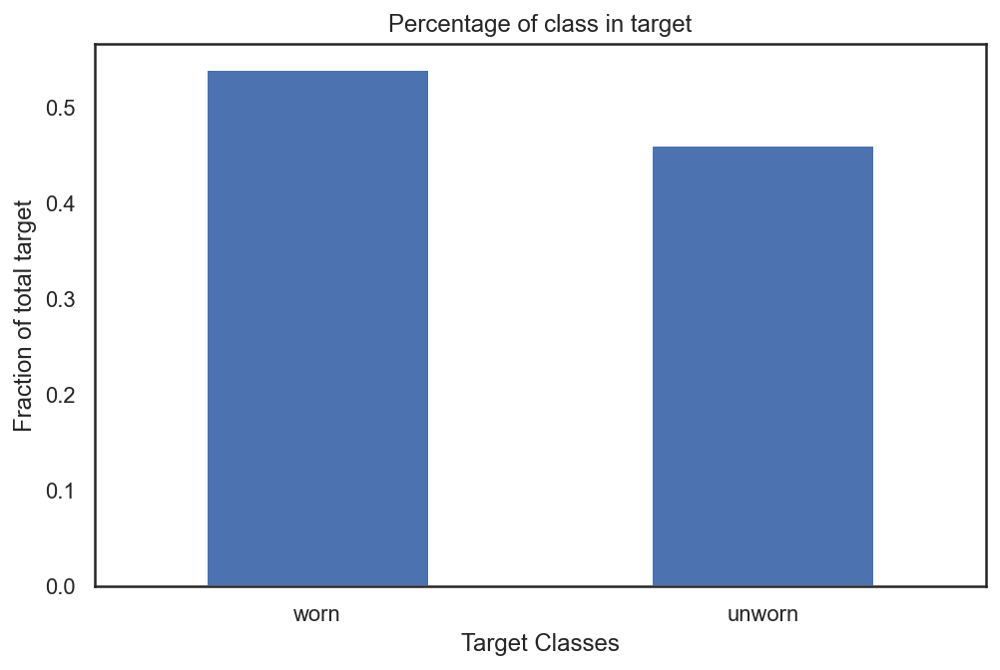

In [19]:
# Find percentage of "output = 1" and "output = 0"

output_percents = exp_df['output'].value_counts(normalize=True) 
print(output_percents)

sns.set_theme(style='white')
#output_percents.plot(kind='bar');
fig, ax = plt.subplots(figsize=(8, 5))
x_index = np.arange(output_percents.count())
map_index = ['worn', 'unworn']
ax.set_xticks(ticks=x_index)    
output_percents.plot(kind='bar')
ax.set_xlabel('Target Classes')
ax.set_ylabel('Fraction of total target')
ax.set_title("Percentage of class in target")
ax.set_xticklabels(map_index,rotation = 0, horizontalalignment = 'center' );

Layer 1 Up      2822
Layer 2 Up      2443
Layer 3 Up      2020
Layer 1 Down    1940
Layer 2 Down    1859
Layer 3 Down    1859
Name: Machining_Process, dtype: int64


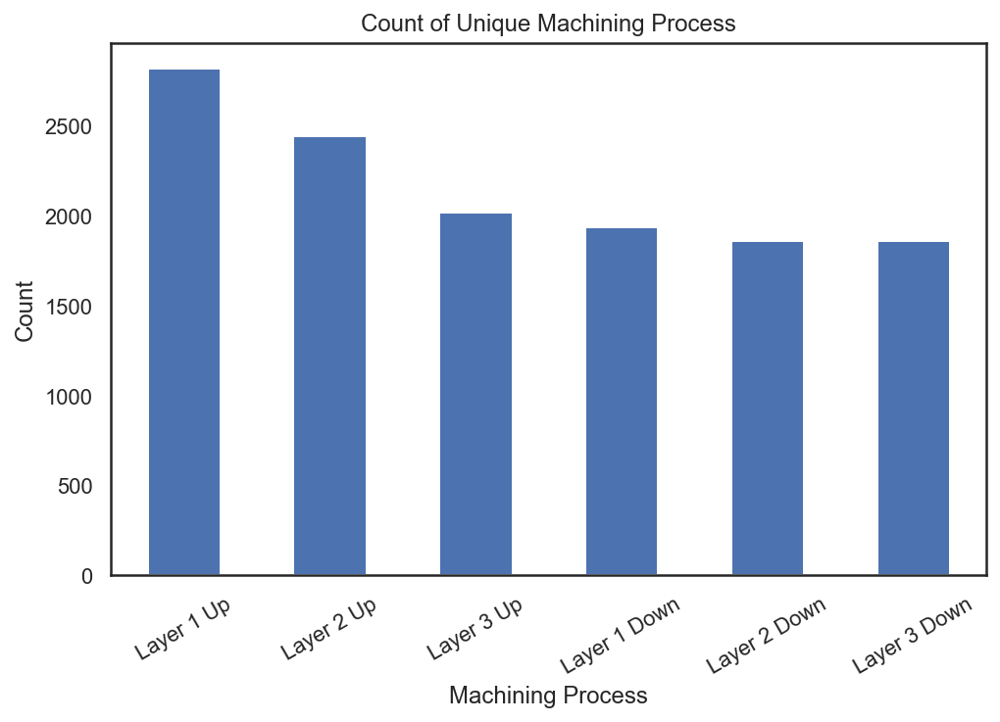

In [20]:
# Distribution of Machining Process

dist_mp = exp_df['Machining_Process'].value_counts() 
print(dist_mp)

# Plot Count of Machining Process

#sns.set_theme(style='white')
#dist_mp.plot(kind='bar');
sns.set_theme(style='white')
fig, ax = plt.subplots(figsize=(8, 5))
x_index = np.arange(output_percents.count())
map_index = ['worn', 'unworn']
ax.set_xticks(ticks=x_index)    
dist_mp.plot(kind='bar')
ax.set_xlabel('Machining Process')
ax.set_ylabel('Count')
ax.set_title("Count of Unique Machining Process")
ax.set_xticklabels(dist_mp.index,rotation = 30, horizontalalignment = 'center' );

In [21]:
# Assign numbers to machining process

#le_mp = LabelEncoder()
#le_mp.fit(exp_df['Machining_Process'])
#exp_df['Machining_Process'] = le_mp.transform(exp_df['Machining_Process'])

mp_id={'Layer 1 Up':1,'Layer 1 Down':2,'Layer 2 Up':3,'Layer 2 Down':4,'Layer 3 Up':5,'Layer 3 Down':6}
exp_df.loc[:, "Machining_Process"] = exp_df.apply(
    lambda x: mp_id.get(x["Machining_Process"], x["Machining_Process"]), axis=1)
exp_df

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,S1_OutputPower,S1_SystemInertia,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,exp_number,feedrate,clamp_pressure,tool_condition,output
0,151.0,0.075,37.50,151.0,0.000,0.00,0.878,0.0377,327.0,1.56,...,0.1500,12.0,12.0,6.0,1,1,6,4.0,unworn,0
1,151.0,-0.075,-37.50,151.0,0.000,0.00,0.664,0.0332,325.0,4.30,...,0.2310,12.0,14.0,6.0,1,1,6,4.0,unworn,0
2,151.0,-6.000,6.25,150.0,-6.000,0.00,-8.100,0.0983,323.0,10.20,...,0.3410,12.0,14.0,6.0,1,1,6,4.0,unworn,0
3,150.0,-6.150,-43.80,150.0,-6.000,0.00,-6.420,0.1010,322.0,11.50,...,0.4410,12.0,14.0,6.0,1,1,6,4.0,unworn,0
4,149.0,-5.930,62.50,149.0,-6.000,0.00,-6.670,0.0980,325.0,14.20,...,0.0746,12.0,14.0,6.0,1,1,6,4.0,unworn,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12938,142.0,-0.525,87.50,142.0,-0.692,1.84,-3.430,0.0694,327.0,7.46,...,0.1400,12.0,2.0,3.0,6,18,3,2.5,worn,1
12939,142.0,-0.350,81.20,142.0,-0.506,1.86,-4.680,0.0808,327.0,7.05,...,0.1890,12.0,98.0,3.0,6,18,3,2.5,worn,1
12940,142.0,-0.075,106.00,142.0,-0.319,1.88,-4.470,0.0692,327.0,6.34,...,0.1810,12.0,98.0,3.0,6,18,3,2.5,worn,1
12941,141.0,0.025,87.50,141.0,-0.131,1.89,-4.700,0.0806,327.0,7.02,...,0.1570,12.0,98.0,3.0,6,18,3,2.5,worn,1


* View pairplot of 10 features at a time.

In [22]:
def plot_features(df):
    
    sns.pairplot(df,hue='output', plot_kws=dict(alpha=.3, edgecolor='none'))

In [23]:
X_cols = ['X1_ActualPosition', 'X1_ActualVelocity', 'X1_ActualAcceleration', 'X1_CommandPosition', \
           'X1_CommandVelocity', 'X1_CommandAcceleration', 'X1_CurrentFeedback', 'X1_DCBusVoltage', \
           'X1_OutputCurrent', 'X1_OutputVoltage', 'X1_OutputPower', 'output']
X_cols_df = exp_df[X_cols]
Y_cols = ['Y1_ActualPosition', 'Y1_ActualVelocity', 'Y1_ActualAcceleration', 'Y1_CommandPosition',\
           'Y1_CommandVelocity', 'Y1_CommandAcceleration', 'Y1_CurrentFeedback', 'Y1_DCBusVoltage',\
           'Y1_OutputCurrent', 'Y1_OutputVoltage','Y1_OutputPower', 'output']
Y_cols_df = exp_df[Y_cols]
Z_cols =  ['Z1_ActualPosition', 'Z1_ActualVelocity', 'Z1_ActualAcceleration', 'Z1_CommandPosition',\
           'Z1_CommandVelocity', 'Z1_CommandAcceleration', 'Z1_CurrentFeedback', 'Z1_DCBusVoltage',\
           'Z1_OutputCurrent', 'Z1_OutputVoltage', 'output']
Z_cols_df = exp_df[Z_cols]
S_cols =  ['S1_ActualPosition', 'S1_ActualVelocity', 'S1_ActualAcceleration', 'S1_CommandPosition',\
           'S1_CommandVelocity', 'S1_CommandAcceleration', 'S1_CurrentFeedback', 'S1_DCBusVoltage',\
           'S1_OutputCurrent', 'S1_OutputVoltage', 'S1_OutputPower', 'S1_SystemInertia', 'output']
S_cols_df = exp_df[S_cols]
M_cols =  ['M1_sequence_number', 'M1_CURRENT_FEEDRATE', 'Machining_Process', 'exp_number', 'feedrate',\
           'clamp_pressure', 'output']
M_cols_df = exp_df[M_cols]

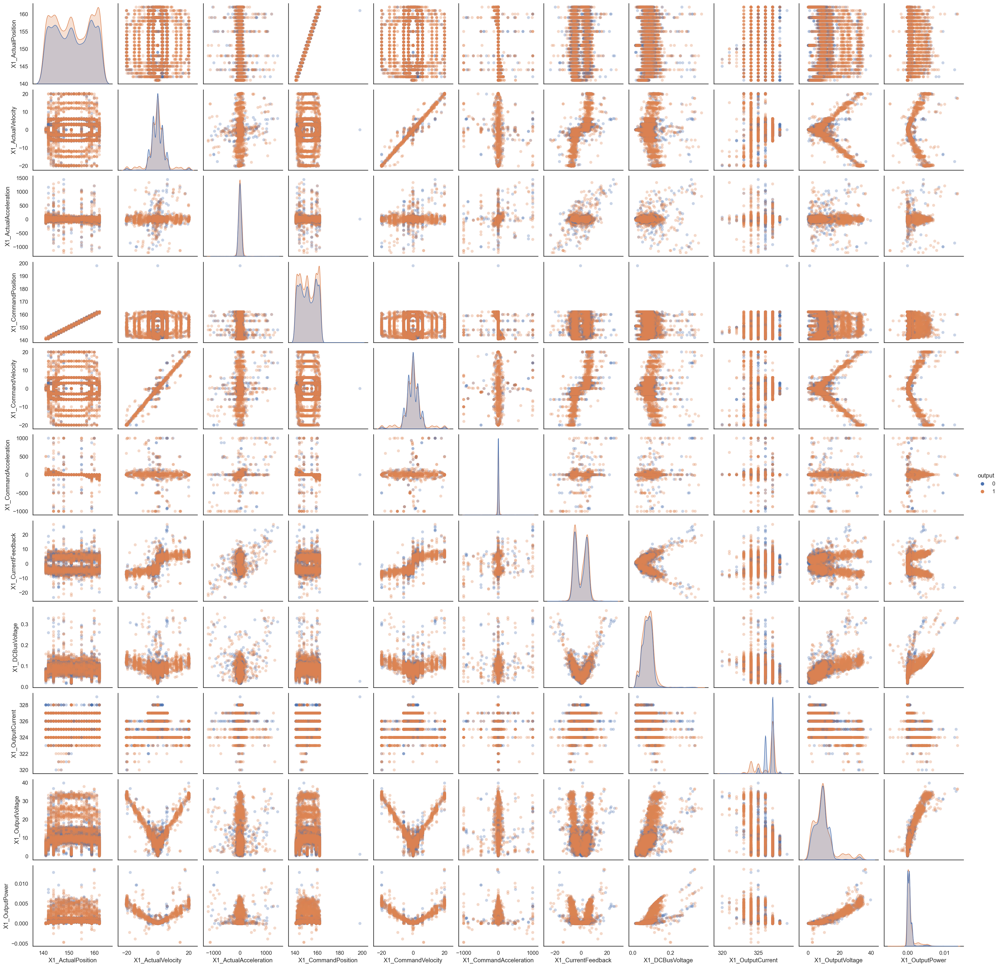

In [24]:
plot_features(X_cols_df)

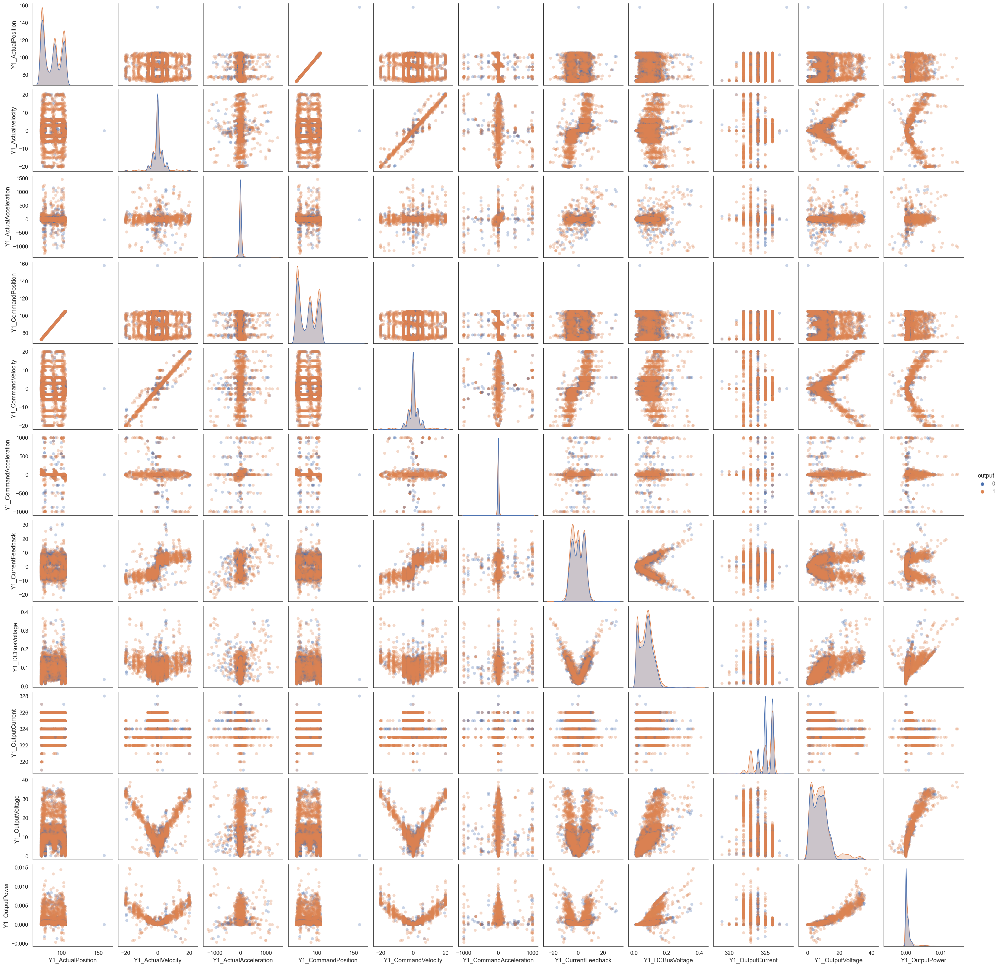

In [25]:
plot_features(Y_cols_df)

/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/

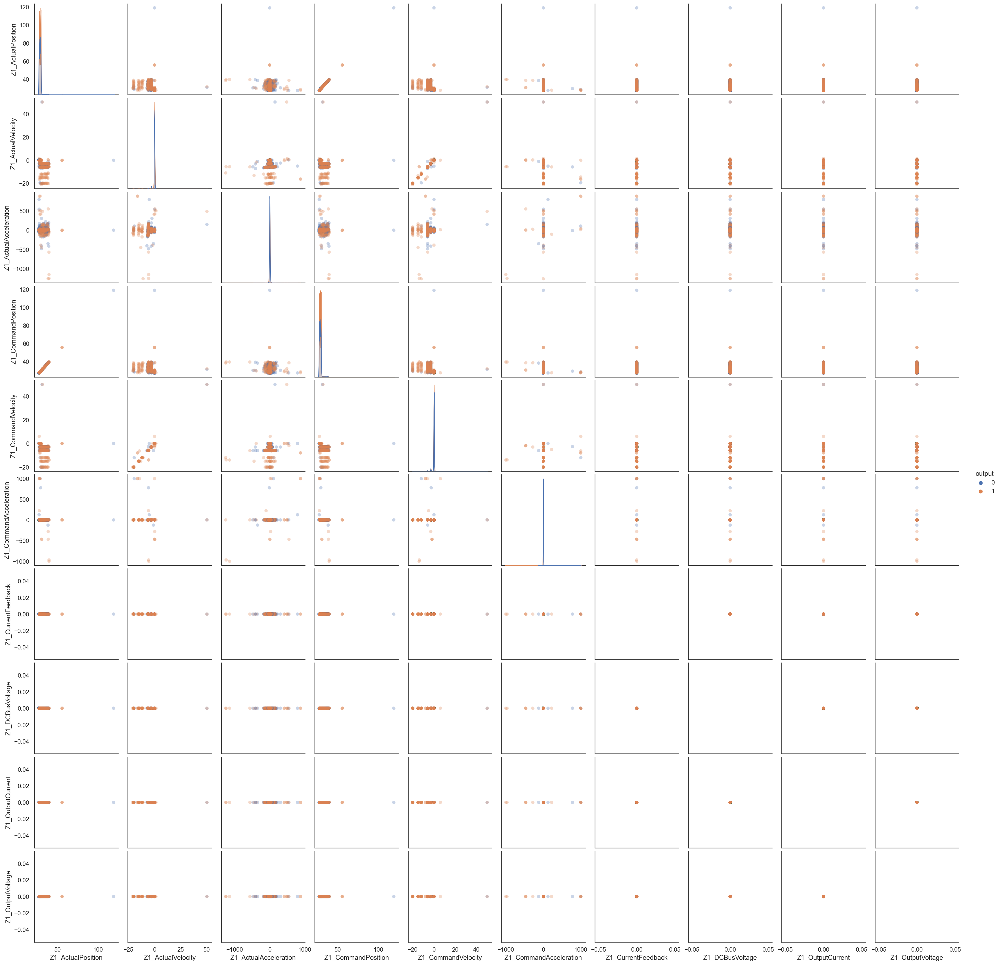

In [26]:
plot_features(Z_cols_df)

Due to zero variance in the features below, the columns will be dropped.

* Z1_CurrentFeedback 
* Z1_DCBusVoltage
* Z1_OutputCurrent
* Z1_OutputVoltage

/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


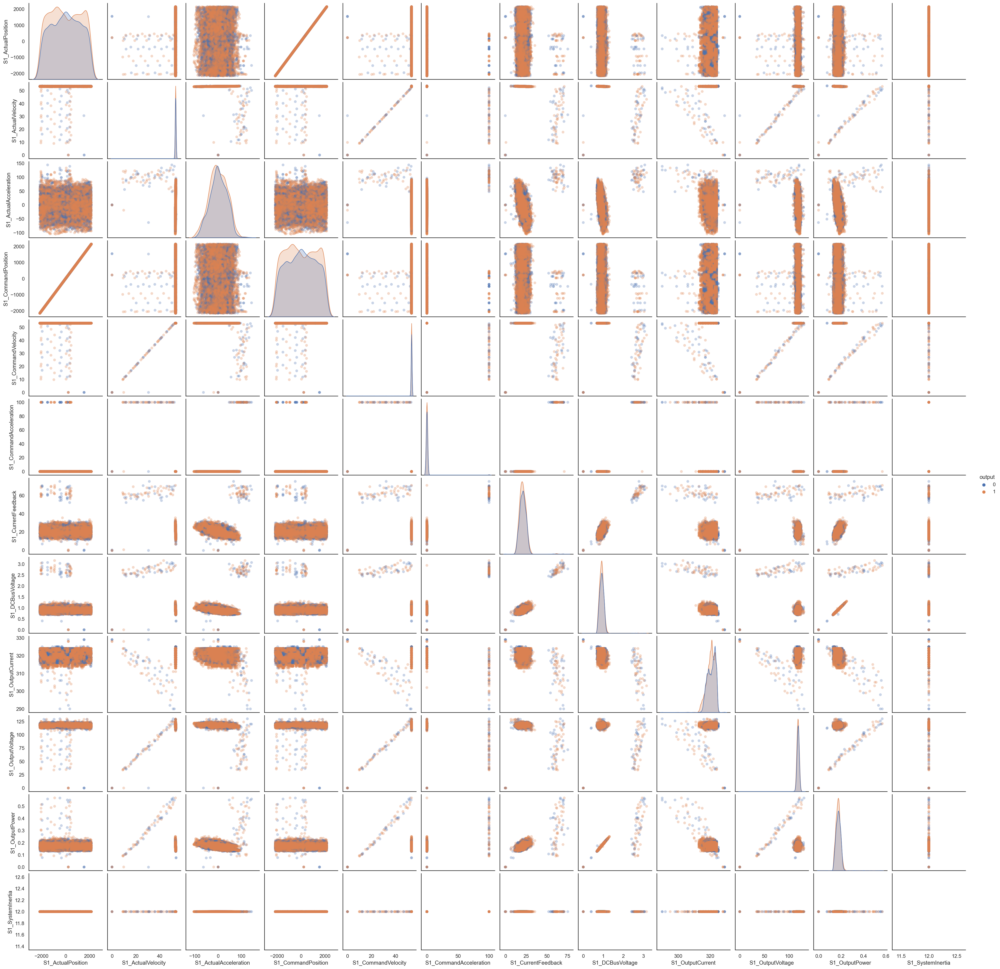

In [27]:
plot_features(S_cols_df)

Due to zero variance in the feature below, the column will be dropped.

* S1_SystemInertia

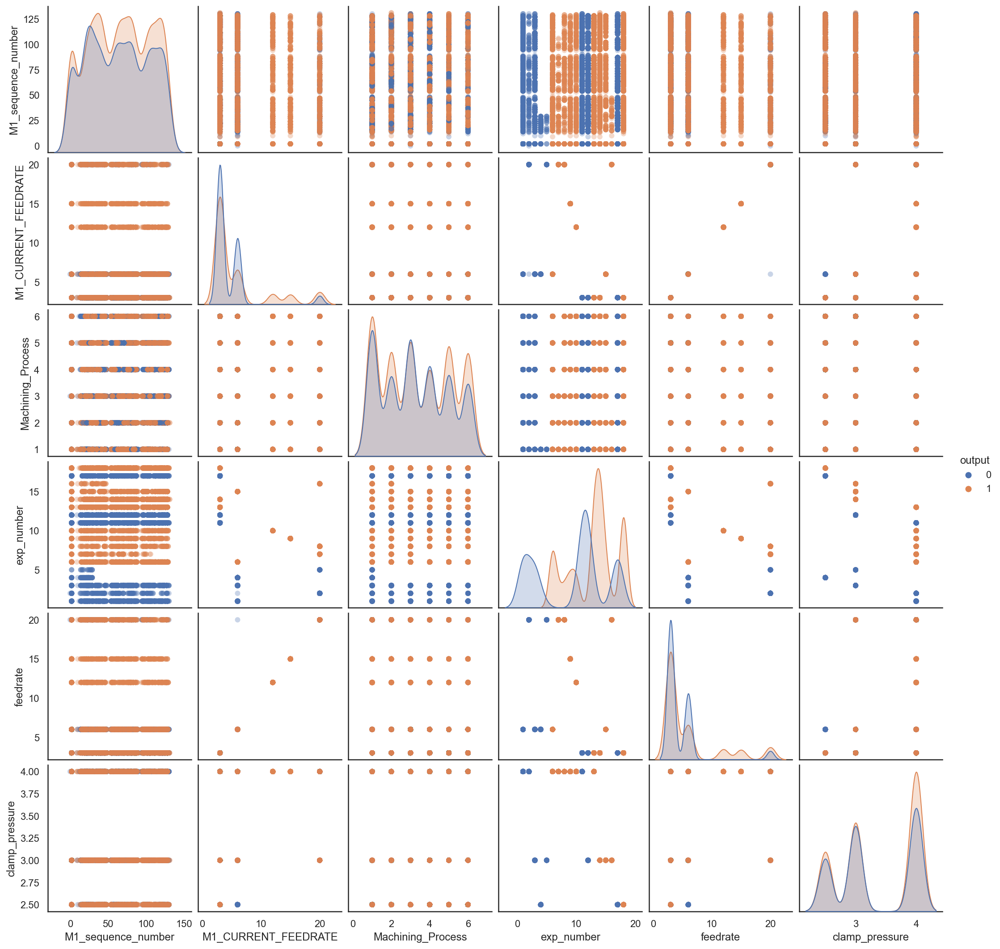

In [28]:
plot_features(M_cols_df)

In [29]:
# Drop columns with zero variance

exp_df = exp_df.drop(['Z1_CurrentFeedback'], axis = 1)
exp_df = exp_df.drop(['Z1_DCBusVoltage'], axis = 1)
exp_df = exp_df.drop(['Z1_OutputCurrent'], axis = 1)
exp_df = exp_df.drop(['Z1_OutputVoltage'], axis = 1)
exp_df = exp_df.drop(['S1_SystemInertia'], axis = 1)

There is no clear distinction between the output class in the pairplot distribution chart. 
Thus, logistic regression is not expected to perform well.

Mill tool wear is highly dependent on;
* Cutting Speed
* Feed Rate
* Mill Tool grade
* Flank Angle
* Cutting temperature

The current dataset contains Feed Rate and parameters that can be used to calculate Cutting Speed.
Starting with one baseline feature:
* M1_CURRENT_FEEDRATE

In [30]:
# Expand Width of column in dataframe display

pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)

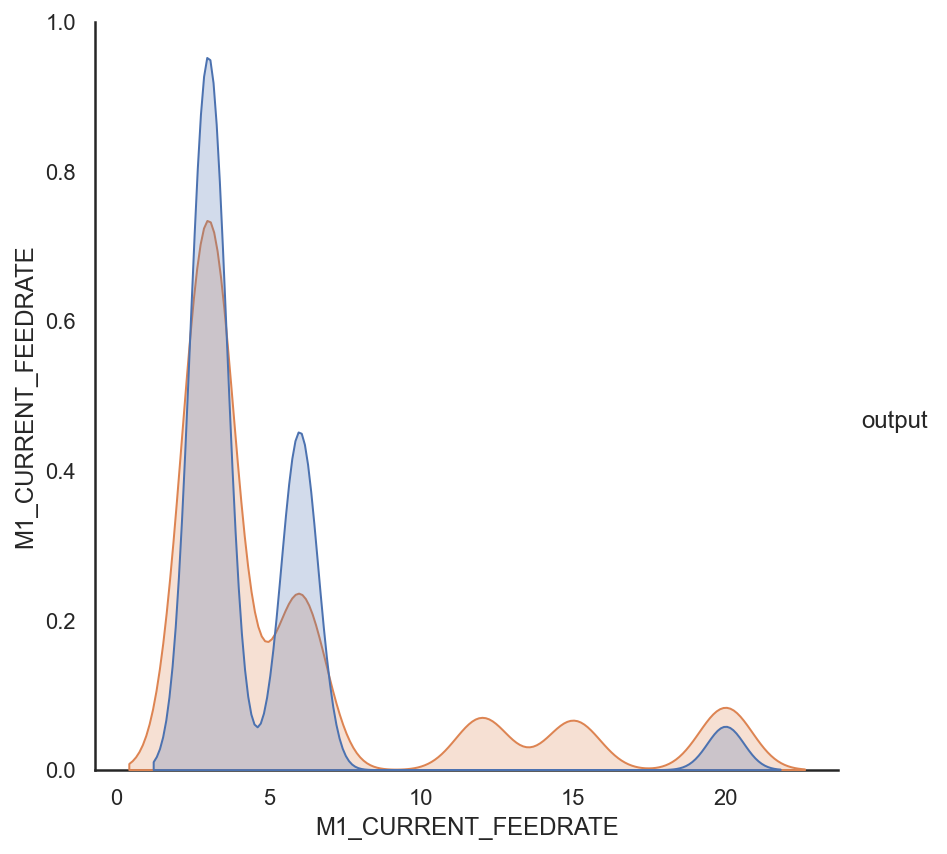

In [31]:
feedrate_df = exp_df[['M1_CURRENT_FEEDRATE','output']]

sns.set_theme(style='white')
g = sns.pairplot(feedrate_df,hue='output', plot_kws=dict(alpha=.3, edgecolor='none'),height=6, aspect=1)

Based on the pairplot below, M1_CURRENT_FEEDRATE has a low predictive signal because there is a significant overlap between the target distributions.

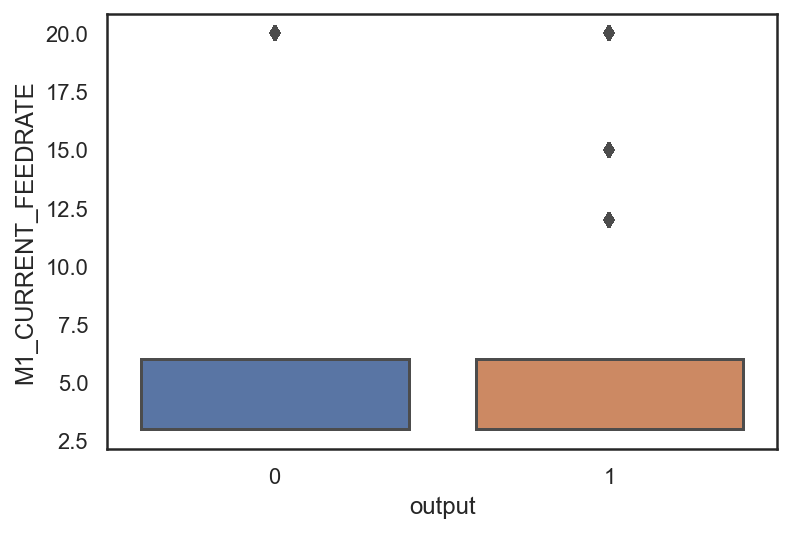

In [32]:
# View box plot to check for linear separatability on M1_CURRENT_FEEDRATE

sns.boxplot(x='output', y='M1_CURRENT_FEEDRATE', data=feedrate_df);

Some Strong features for distinguishing between worn and unworn outputs are;
* Y1_OutputCurrent
* S1_OutputCurrent
* X1_ActualPosition
* X1_OutputCurrent

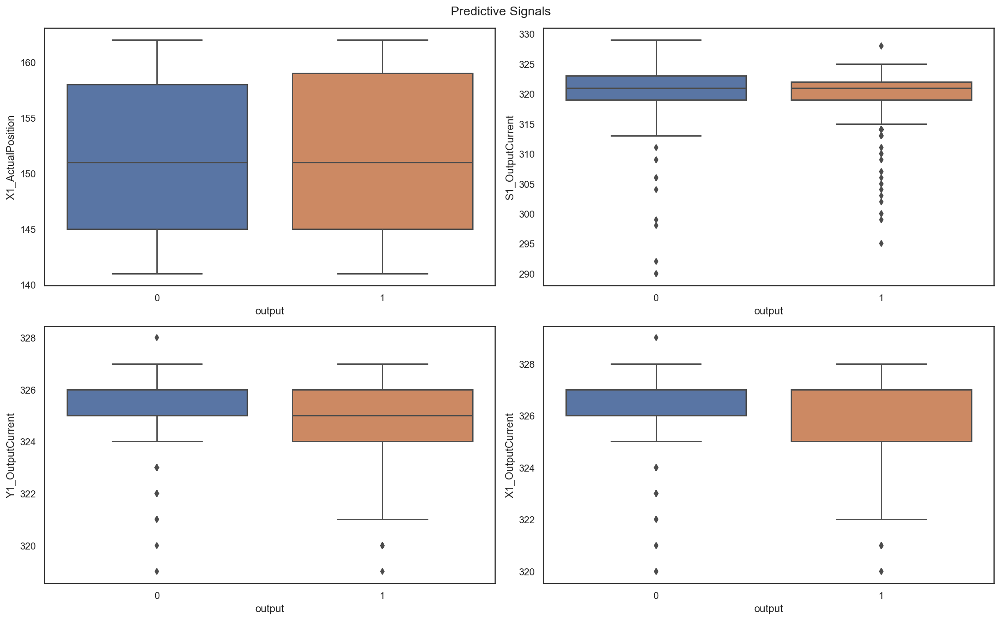

In [33]:
sns.set_theme(style='white')
fig, axes = plt.subplots(2,2, figsize=(16, 10))
   
g1 = sns.boxplot(x='output', y='X1_ActualPosition', data=exp_df, ax=axes[0,0]); 
g2 = sns.boxplot(x='output', y='S1_OutputCurrent', data=exp_df, ax=axes[0,1]);
g3 = sns.boxplot(x='output', y='Y1_OutputCurrent', data=exp_df, ax=axes[1,0]);
g4 = sns.boxplot(x='output', y='X1_OutputCurrent', data=exp_df, ax=axes[1,1]);

fig.suptitle('Predictive Signals');
fig.tight_layout()

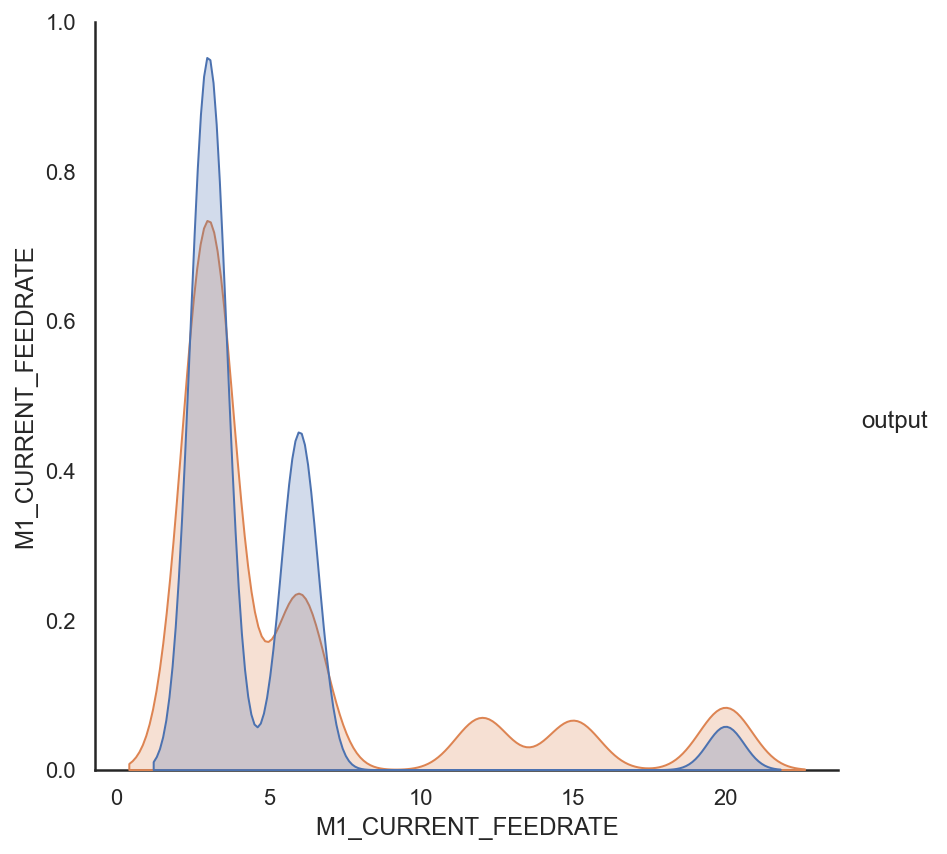

In [34]:
XAP_df = exp_df[['M1_CURRENT_FEEDRATE','output']]
g = sns.pairplot(XAP_df,hue='output', plot_kws=dict(alpha=.3, edgecolor='none'),height=6, aspect=1)

In [35]:
def get_user_split_data(df, test_size=.2, seed=42):

    rs = np.random.RandomState(seed)
    
    total_exp = df['exp_number'].unique() # Array of exp numbers
    test_exp = rs.choice(total_exp, 
                           size=int(total_exp.shape[0] * test_size), 
                           replace=False)

    df_tr = df[~df['exp_number'].isin(test_exp)]
    df_te = df[df['exp_number'].isin(test_exp)] 

    y_tr, y_te = df_tr['output'], df_te['output']
    X_tr = df_tr.drop(['exp_number','output'],axis=1) 
    X_te = df_te.drop(['exp_number','output'],axis=1)

    return X_tr, X_te, y_tr, y_te

In [36]:
df_X = exp_df[['M1_CURRENT_FEEDRATE','exp_number','output']]

X_tr, X_te, y_tr, y_te = get_user_split_data(df_X)

An unbalanced test set was created with the custom split.

In [37]:
output_p = y_te.value_counts(normalize=True) 
print(output_p)

0    0.755821
1    0.244179
Name: output, dtype: float64


In [38]:
df_X1 = exp_df[['M1_CURRENT_FEEDRATE','tool_condition']]
y = exp_df['output']
X_tr1, X_te1, y_tr1, y_te1 = train_test_split(df_X1, y, test_size = .2, random_state=42)

Standard split did not create an unbalanced test set.

In [39]:
output_p1 = y_te1.value_counts(normalize=True) 
print(output_p1)

1    0.552337
0    0.447663
Name: output, dtype: float64


Logistic Regression accuracy on test set is poor for custom split.

The Accuracy score for logistic regression is
Training:  58.08%
Test set:  24.42%


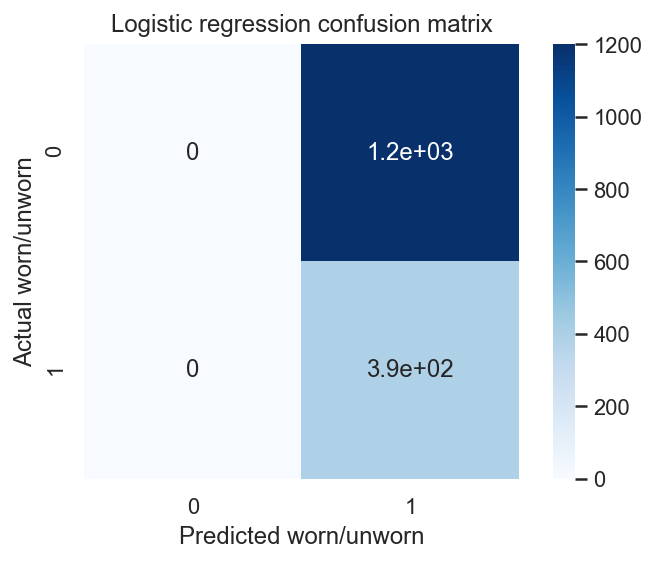

In [40]:
# Logistic Regression
# Use large C since we want complex scheme and we do not want regularization.
# if we have imbalance, then we can set small, C = 0.95, and ensure that we normalize the dataset before regularization
#log_reg = LogisticRegression(C = 0.95, solver='lbfgs')

#Scale features (only when you have multiple features in train/set)
#scaler = StandardScaler()
#X_tr_std = scaler.fit_transform(X_tr)
#X_te_std  = scaler.transform(X_te)


X_tr_std  = X_tr
X_te_std  = X_te

log_reg=LogisticRegression(C=0.95, solver='lbfgs',max_iter=1000)
log_reg.fit(X_tr_std,y_tr)

print("The Accuracy score for logistic regression is")
#print("F1 Score: {:6.2f}%".format(100*f1_score(log_reg.predict(X_te_std), y_te))) 
print("Training: {:6.2f}%".format(100*log_reg.score(X_tr_std, y_tr)))
print("Test set: {:6.2f}%".format(100*log_reg.score(X_te_std, y_te)))

# Print confusion matrix for logistic regression
log_reg_confusion = confusion_matrix(y_te, log_reg.predict(X_te_std))
sns.heatmap(log_reg_confusion, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])

plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('Logistic regression confusion matrix');

#plt.savefig("confusion_matrix_mill_wear_feed_rate")

Logistic Regression accuracy on test set using standard split is more than twice the accuracy from custom split.

The Accuracy score for logistic regression is
Training:  50.76%
Test set:  49.90%


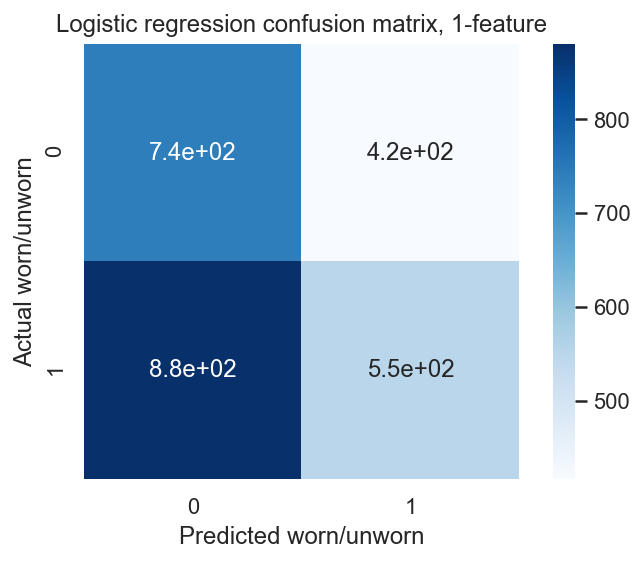

In [41]:
#Scale features (only when you have multiple features in train/set)
#scaler = StandardScaler()
#X_tr1_std = scaler.fit_transform(X_tr1[['M1_CURRENT_FEEDRATE']])
#X_te1_std  = scaler.transform(X_te1[['M1_CURRENT_FEEDRATE']])

X_tr1_std = X_tr1[['M1_CURRENT_FEEDRATE']]
X_te1_std = X_te1[['M1_CURRENT_FEEDRATE']]

log_reg1 = LogisticRegression(C=0.95, solver='lbfgs',max_iter=1000)
log_reg1.fit(X_tr1_std,y_tr1)
print("The Accuracy score for logistic regression is")
print("Training: {:6.2f}%".format(100*log_reg1.score(X_tr1_std, y_tr1)))
print("Test set: {:6.2f}%".format(100*log_reg1.score(X_te1_std, y_te1)))

# Print confusion matrix for logistic regression
log_reg_confusion1 = confusion_matrix(y_te1, log_reg1.predict(X_te1_std))
sns.heatmap(log_reg_confusion1, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])

plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('Logistic regression confusion matrix, 1-feature');

In [42]:
def viz_ToolWear_LR(df, model, hard_classification=True, decision_boundary=False):

    # extract elevation feature and hard or soft predictions
    feature = df[['M1_CURRENT_FEEDRATE']].values
    if hard_classification:
        predictions = model.predict(feature)
    else:
        predictions = model.predict_proba(feature)[:, 1] 

    # color filter true class labels and plot predictions
    sf_mask = (df['tool_condition'] == 'worn').values
    plt.plot(feature[sf_mask], predictions[sf_mask], 'bo', label='Actually worn', alpha=0.2)
    plt.plot(feature[~sf_mask], predictions[~sf_mask], 'ro', label='Actually unworn', alpha=0.2)
    
    # optionally calculate and display decision boundary as dotted line
    if decision_boundary:
        b_0, b_1 = model.intercept_, model.coef_[0]
        plt.gca().axvline(-b_0/b_1,c='k',ls='--',lw=1)
    
    # plot formatting
    plt.ylim(-0.05, 1.05)
    plt.xlabel('M1_CURRENT_FEEDRATE (mm/min)')
    plt.ylabel('Prediction (1=worn)')
    type_str = 'hard' if hard_classification else 'soft'
    plt.title('Logistic regression ' + type_str + ' prediction for worn vs unworn')
    plt.legend(loc='lower right')

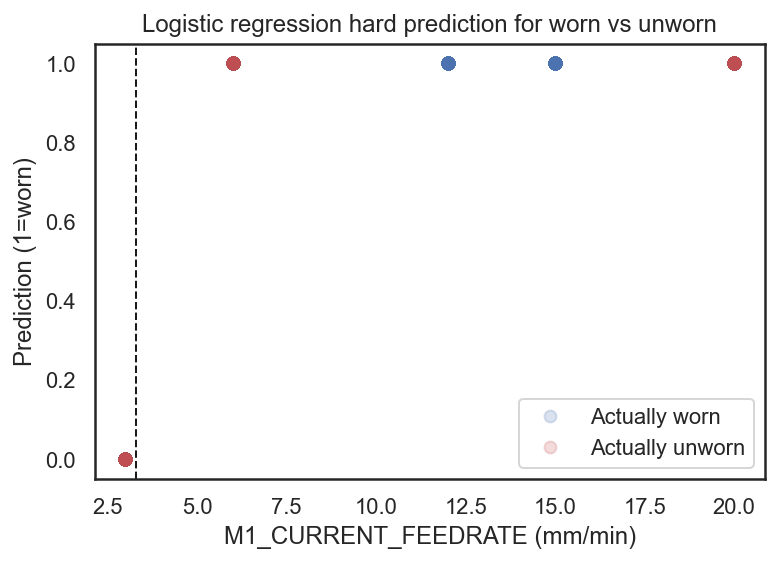

In [43]:
viz_ToolWear_LR(X_tr1, log_reg1, decision_boundary=True)

In [44]:
log_reg1.predict_proba([[2],[2.9],[16]])[:,1]

array([0.4752832 , 0.49253918, 0.72630938])

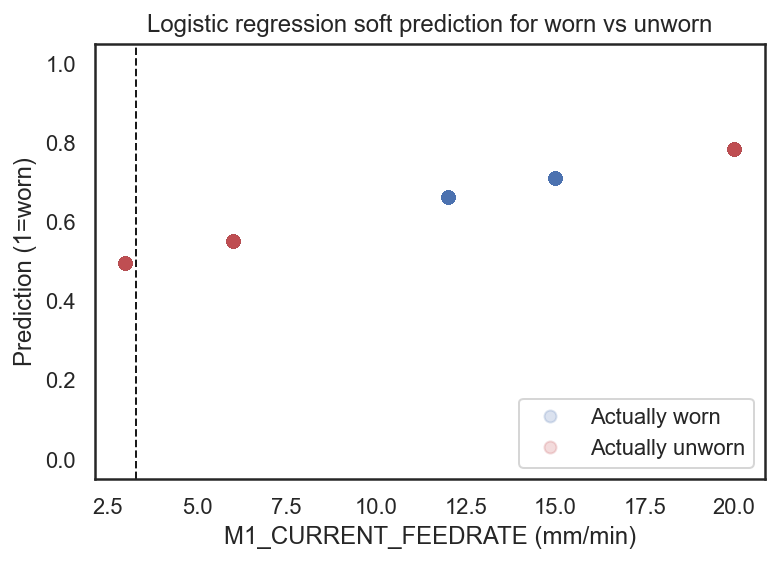

In [45]:
viz_ToolWear_LR(X_tr1, log_reg1, hard_classification=False, decision_boundary=True)

In [46]:
# Log loss of each feature
X_logloss_df = exp_df.drop(['tool_condition','output'],axis=1)
y = exp_df[['output']]
X_tr, X_te, y_tr, y_te = train_test_split(X_logloss_df, y, test_size = .2, random_state=42)

for col in X_tr.columns:
    print(col)
    X_ttr = X_tr[[col]]
    X_tte = X_te[[col]]
    lr_model = LogisticRegression()
    lr_model.fit(X_ttr,y_tr)
    y_prob_pred_test = lr_model.predict_proba(X_tte)[:,1]
    print(log_loss(y_te,y_prob_pred_test))

X1_ActualPosition
0.6880281089391741
X1_ActualVelocity
0.6882069057658887
X1_ActualAcceleration
0.6877601121720245
X1_CommandPosition
0.6880300993189536
X1_CommandVelocity
0.6882198309557628
X1_CommandAcceleration
0.6881440488632709
X1_CurrentFeedback
0.6881802748462374
X1_DCBusVoltage


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the s

0.6875660096061152
X1_OutputCurrent
0.6882467892948767
X1_OutputVoltage
0.6839200547296447
X1_OutputPower
0.6881543469195291
Y1_ActualPosition
0.6878937391794934
Y1_ActualVelocity
0.6879551349797468
Y1_ActualAcceleration
0.6881963721224967
Y1_CommandPosition
0.6878963324079813
Y1_CommandVelocity
0.6878963798191234
Y1_CommandAcceleration


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the s

0.6883668448501798
Y1_CurrentFeedback
0.6873459537431972
Y1_DCBusVoltage
0.6874527545996959
Y1_OutputCurrent
0.6882344968592865
Y1_OutputVoltage
0.685224043923529
Y1_OutputPower
0.6881635384686935
Z1_ActualPosition
0.6858594741230205
Z1_ActualVelocity
0.6887853598836656
Z1_ActualAcceleration


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the s

0.6881282527026901
Z1_CommandPosition
0.6858296248464474
Z1_CommandVelocity
0.688741199196064
Z1_CommandAcceleration
0.6881596187260604
S1_ActualPosition
0.6880585726035563
S1_ActualVelocity
0.6882010359237791
S1_ActualAcceleration


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the s

0.6883458950469823
S1_CommandPosition
0.688058672797811
S1_CommandVelocity
0.6882039548992748
S1_CommandAcceleration
0.6882894064970471
S1_CurrentFeedback
0.6881543613521256
S1_DCBusVoltage
0.6881787711591196
S1_OutputCurrent
0.6882450472702578
S1_OutputVoltage
0.6882475393124707
S1_OutputPower


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the s

0.6880373789238976
M1_sequence_number
0.6880489497954287
M1_CURRENT_FEEDRATE
0.6752403723627132
Machining_Process
0.6871846878218071
exp_number
0.6211645890872264
feedrate


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the s

0.6752411780279647
clamp_pressure
0.6876140662233332


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


log_loss is high for all the features. This implies that all the features have low predictive ability.
The features with lower log_loss is:
- M1_CURRENT_FEEDRATE
   * 0.6752403723627132

#### Add Acceleration features to see improvement in accuracy score.

In [47]:
df_X2 = exp_df[['M1_CURRENT_FEEDRATE','X1_ActualAcceleration']]
y = exp_df['output']
X_tr1, X_te1, y_tr1, y_te1 = train_test_split(df_X2, y, test_size = .2, random_state=42)

The Accuracy score for logistic regression is
Training:  52.73%
Test set:  52.45%


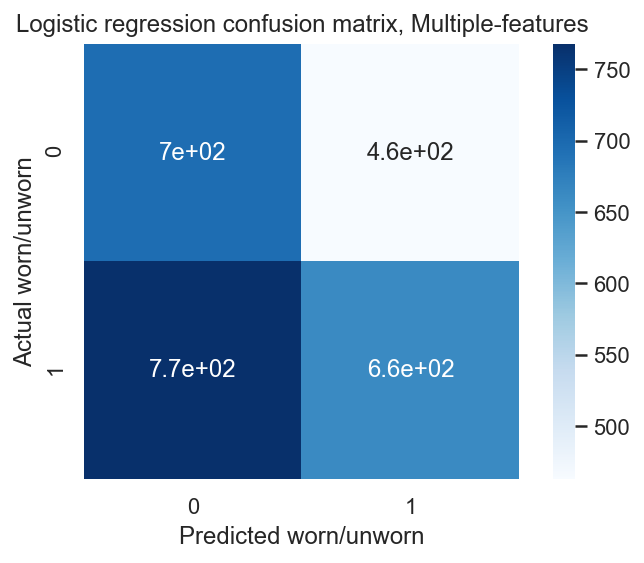

In [48]:
#Scale features (only when you have multiple features in train/set)
scaler = StandardScaler()
X_tr1_std = scaler.fit_transform(X_tr1)
X_te1_std = scaler.transform(X_te1)


log_reg1 = LogisticRegression(C=0.95, solver='lbfgs',max_iter=1000)
log_reg1.fit(X_tr1_std,y_tr1)
print("The Accuracy score for logistic regression is")
print("Training: {:6.2f}%".format(100*log_reg1.score(X_tr1_std, y_tr1)))
print("Test set: {:6.2f}%".format(100*log_reg1.score(X_te1_std, y_te1)))

# Print confusion matrix for logistic regression
log_reg_confusion1 = confusion_matrix(y_te1, log_reg1.predict(X_te1_std))
sns.heatmap(log_reg_confusion1, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])

plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('Logistic regression confusion matrix, Multiple-features');

### Feature Engineering

Calculate cutting speed of mill tool

In [49]:
# Cutting Speed, V_c
# V_c(mm/s) = PI * D * n
# D = Diameter of mill tool
# n = Spindle speed (rev/min)

# Find change in spindle velocity for every observation

exp_df['DS1'] = abs(exp_df['S1_ActualVelocity'] - exp_df['S1_CommandVelocity'])

# Subtract the square root of the sum of squares from Speed of sindle
# Cutting Speed = Speed of mill tool - Speed of workpiece

exp_df['Cutting_Speed'] = exp_df['DS1']*60
exp_df = exp_df.drop(['DS1'], axis=1)

In [50]:
exp_df.head()

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,X1_OutputPower,Y1_ActualPosition,Y1_ActualVelocity,Y1_ActualAcceleration,Y1_CommandPosition,Y1_CommandVelocity,Y1_CommandAcceleration,Y1_CurrentFeedback,Y1_DCBusVoltage,Y1_OutputCurrent,Y1_OutputVoltage,Y1_OutputPower,Z1_ActualPosition,Z1_ActualVelocity,Z1_ActualAcceleration,Z1_CommandPosition,Z1_CommandVelocity,Z1_CommandAcceleration,S1_ActualPosition,S1_ActualVelocity,S1_ActualAcceleration,S1_CommandPosition,S1_CommandVelocity,S1_CommandAcceleration,S1_CurrentFeedback,S1_DCBusVoltage,S1_OutputCurrent,S1_OutputVoltage,S1_OutputPower,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,exp_number,feedrate,clamp_pressure,tool_condition,output,Cutting_Speed
0,151.0,0.075,37.50,151.0,0.0,0.0,0.878,0.0377,327.0,1.56,0.000008,73.0,0.025,6.25,73.0,0.0,0.0,-0.1000,0.0184,325.0,1.82,0.000002,30.2,-5.88,-25.0,30.1,-6.00,0.0,-360.0,15.8,98.3,-360.0,16.6,1.000000e+02,56.70,2.560,318.0,44.9,0.1500,12.0,6.0,1,1,6,4.0,unworn,0,48.0
1,151.0,-0.075,-37.50,151.0,0.0,0.0,0.664,0.0332,325.0,4.30,0.000004,73.0,-0.075,-31.30,73.0,0.0,0.0,1.9800,0.0194,324.0,0.51,-0.000003,29.5,-5.80,-12.5,29.5,-2.67,778.0,-358.0,26.3,88.5,-358.0,27.0,1.000000e+02,54.70,2.410,317.0,72.8,0.2310,14.0,6.0,1,1,6,4.0,unworn,0,42.0
2,151.0,-6.000,6.25,150.0,-6.0,0.0,-8.100,0.0983,323.0,10.20,0.001260,73.0,0.050,25.00,73.0,0.0,0.0,-0.0991,0.0258,322.0,1.10,0.000002,29.5,0.00,0.0,29.5,0.00,0.0,-355.0,35.9,98.9,-354.0,36.6,1.000000e+02,62.00,2.610,309.0,88.4,0.3410,14.0,6.0,1,1,6,4.0,unworn,0,42.0
3,150.0,-6.150,-43.80,150.0,-6.0,0.0,-6.420,0.1010,322.0,11.50,0.001260,73.0,0.050,18.80,73.0,0.0,0.0,0.2200,0.0340,322.0,1.29,-0.000004,29.5,0.00,0.0,29.5,0.00,0.0,-351.0,45.9,125.0,-350.0,46.6,1.000000e+02,59.00,2.650,306.0,109.0,0.4410,14.0,6.0,1,1,6,4.0,unworn,0,42.0
4,149.0,-5.930,62.50,149.0,-6.0,0.0,-6.670,0.0980,325.0,14.20,0.001180,73.0,-0.100,-50.00,73.0,0.0,0.0,1.1800,0.0209,324.0,2.25,-0.000001,29.5,0.00,0.0,29.5,0.00,0.0,-345.0,53.7,-51.0,-345.0,53.3,-9.540000e-07,9.37,0.389,324.0,112.0,0.0746,14.0,6.0,1,1,6,4.0,unworn,0,24.0


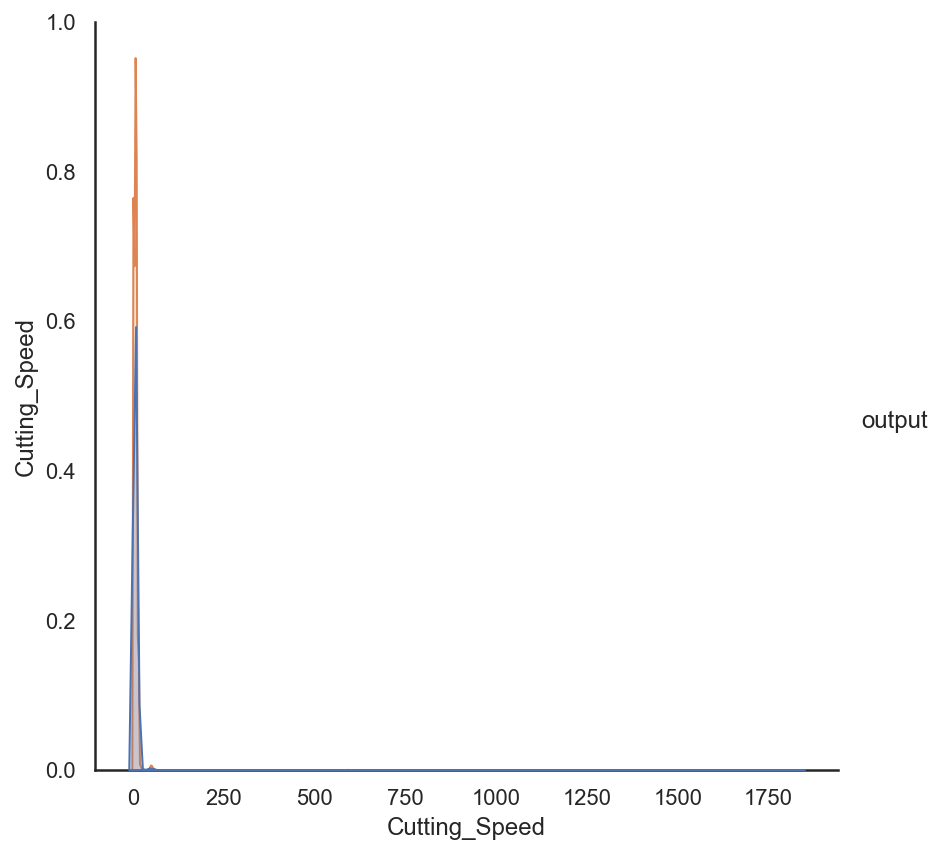

In [51]:
cutting_speed_df = exp_df[['Cutting_Speed','output']]
g = sns.pairplot(cutting_speed_df,hue='output', plot_kws=dict(alpha=.3, edgecolor='none'),height=6, aspect=1)

There is still no strong linear signal.

Add Cutting_Speed to the the baseline with M1_CURRENT_FEEDRATE and X1_ActualAcceleration features.

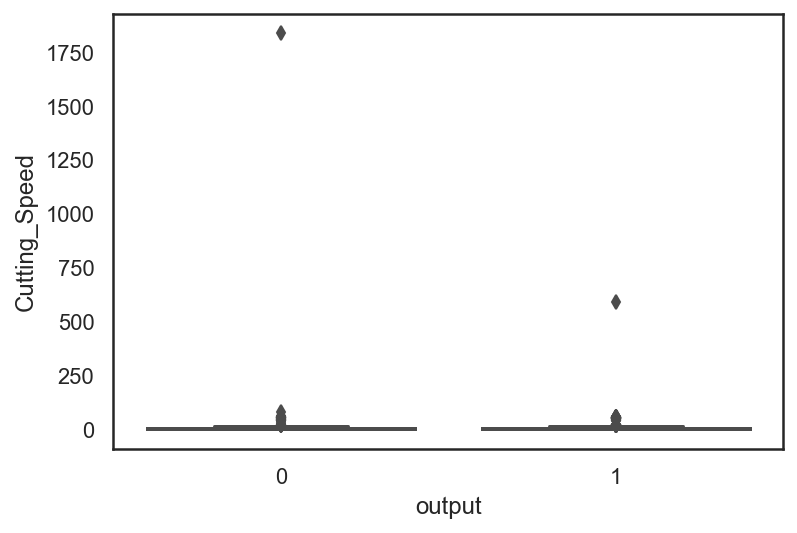

In [52]:
# View box plot to check for linear separatability on Cutting_Speed

sns.boxplot(x='output', y='Cutting_Speed', data= cutting_speed_df);

In [53]:
df_X2 = exp_df[['M1_CURRENT_FEEDRATE','X1_ActualAcceleration', 'Cutting_Speed']]
y = exp_df['output']
X_tr1, X_te1, y_tr1, y_te1 = train_test_split(df_X2, y, test_size = .2, random_state=42)

The Accuracy score for logistic regression is
Training:  52.36%
Test set:  52.38%


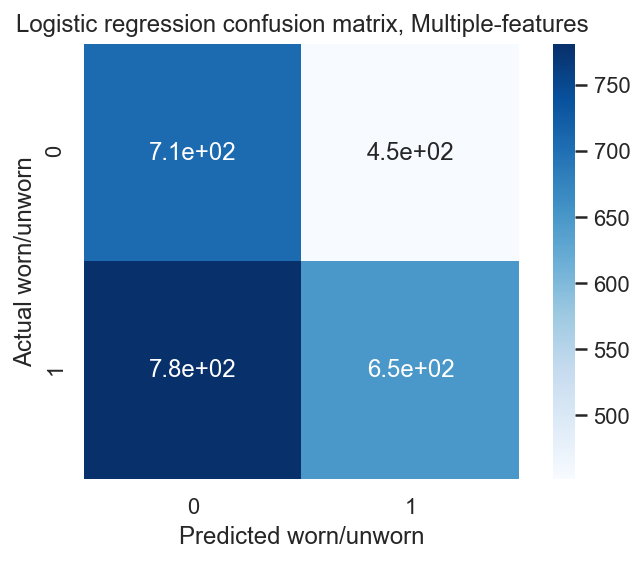

In [54]:
#Scale features (only when you have multiple features in train/set)
scaler = StandardScaler()
X_tr1_std = scaler.fit_transform(X_tr1)
X_te1_std = scaler.transform(X_te1)


log_reg1 = LogisticRegression(C=0.95, solver='lbfgs',max_iter=1000)
log_reg1.fit(X_tr1_std,y_tr1)
print("The Accuracy score for logistic regression is")
print("Training: {:6.2f}%".format(100*log_reg1.score(X_tr1_std, y_tr1)))
print("Test set: {:6.2f}%".format(100*log_reg1.score(X_te1_std, y_te1)))

# Print confusion matrix for logistic regression
log_reg_confusion1 = confusion_matrix(y_te1, log_reg1.predict(X_te1_std))
sns.heatmap(log_reg_confusion1, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])

plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('Logistic regression confusion matrix, Multiple-features');

Note: The added feature did not improve the performance of logistic regression.

Solution: Try tree based and neural nets models.

### Calculate accuracy on different models using all the useful features

In [55]:
exp_df = exp_df.drop(['exp_number'], axis = 1)
exp_df = exp_df.drop(['feedrate'], axis = 1)
exp_df = exp_df.drop(['clamp_pressure'], axis = 1)
exp_df = exp_df.drop(['tool_condition'], axis = 1)

#### Test/Train Dataframe

In [56]:
X = exp_df.drop('output', axis = 1)
y = exp_df['output']

In [57]:
X.shape

(12943, 43)

#### Perform Train/Test split - 80% train and 20% test

In [58]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state=42)

#### Model 1 - Logistic Regression

In [59]:
#logreg=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
#                   intercept_scaling=1, l1_ratio=None, max_iter=100,
#                   multi_class='auto', n_jobs=None, penalty='l2',
#                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
#                   warm_start=False)

#logreg=LogisticRegression(C=1000, solver='lbfgs', max_iter=1000)

#Scale features
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std  = scaler.transform(X_test)

logreg=LogisticRegression(C=0.95, solver='lbfgs',max_iter=1000)
logreg.fit(X_train_std,y_train)
logreg_pred=logreg.predict(X_test_std)
Accuracy_logreg_train = logreg.score(X_train_std, y_train)
Accuracy_logreg_test = logreg.score(X_test_std, y_test)

print("The Accuracy score for logistic regression is:")
print("Training: {:6.2f}%".format(100*Accuracy_logreg_train))
print("Test set: {:6.2f}%".format(100*Accuracy_logreg_test))

The Accuracy score for logistic regression is:
Training:  58.12%
Test set:  57.90%


#### Model 2 - K Nearest Neighbor

In [60]:
knn = KNeighborsClassifier(n_neighbors=13, weights='uniform')
knn.fit(X_train, y_train)
knn_pred = knn.predict(X_test)
Accuracy_knn_train = knn.score(X_train,y_train)
Accuracy_knn_test = knn.score(X_test,y_test)

print("The Accuracy score for K Nearest Neighbor is:")
print("Training: {:6.2f}%".format(100*Accuracy_knn_train))
print("Test set: {:6.2f}%".format(100*Accuracy_knn_test))

The Accuracy score for K Nearest Neighbor is:
Training:  74.00%
Test set:  66.32%


#### Model 3 - Stochastic Gradient

In [61]:
sgd = SGDClassifier()
sgd.fit(X_train,y_train)
sgd_pred = sgd.predict(X_test)
Accuracy_sgd_train = sgd.score(X_train,y_train)
Accuracy_sgd_test = sgd.score(X_test,y_test)

print("The Accuracy score for Stochastic Gradient is:")
print("Training: {:6.2f}%".format(100*Accuracy_sgd_train))
print("Test set: {:6.2f}%".format(100*Accuracy_sgd_test))

The Accuracy score for Stochastic Gradient is:
Training:  56.19%
Test set:  56.47%


#### Model 4 - Linear Support Vector Machine

In [62]:
# Scale the features
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std  = scaler.transform(X_test)

svm = LinearSVC(C = 0.95, max_iter=1000)
svm.fit(X_train_std,y_train)
svm_pred = svm.predict(X_test_std)
Accuracy_svm_train = svm.score(X_train_std,y_train)
Accuracy_svm_test = svm.score(X_test_std,y_test)

print("The Accuracy score for Linear Support Vector Machine is:")
print("Training: {:6.2f}%".format(100*Accuracy_svm_train))
print("Test set: {:6.2f}%".format(100*Accuracy_svm_test))

The Accuracy score for Linear Support Vector Machine is:
Training:  59.02%
Test set:  57.98%


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


#### Model 5 - Random Forest

In [63]:
rmf = RandomForestClassifier(n_estimators = 100, max_features = 3, n_jobs=-1)
rmf.fit(X_train,y_train)
rmf_pred = rmf.predict(X_test)
Accuracy_rmf_train = rmf.score(X_train,y_train)
Accuracy_rmf_test = rmf.score(X_test,y_test)

print("The Accuracy score for Random Forest is:")
print("Training: {:6.2f}%".format(100*Accuracy_rmf_train))
print("Test set: {:6.2f}%".format(100*Accuracy_rmf_test))

The Accuracy score for Random Forest is:
Training: 100.00%
Test set:  99.03%


The Area Under Curve Score for Random Forest is:
AUC Score: 98.9869%


Confusion Matrix for Random Forest is:
[[1142   17]
 [   8 1422]]


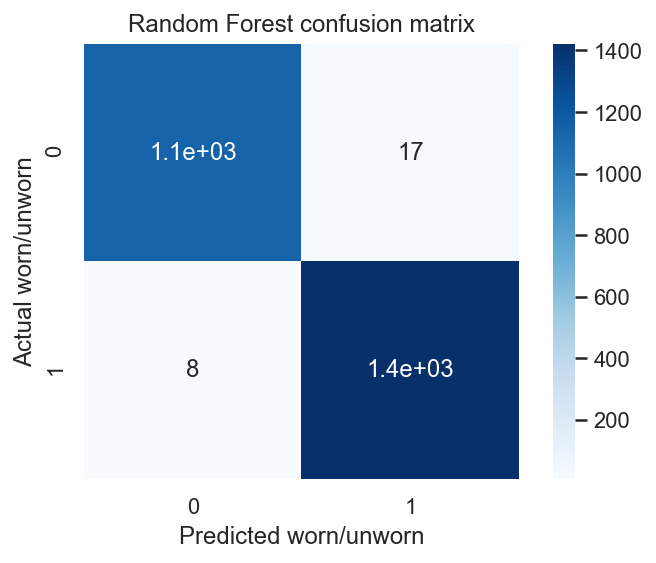

In [64]:
AUC_rmf_score = roc_auc_score(y_test, rmf_pred)
print("The Area Under Curve Score for Random Forest is:")
print("AUC Score: {:6.4f}%".format(100*AUC_rmf_score))

print('\n')
print("Confusion Matrix for Random Forest is:")
conf_matrix_rmf = confusion_matrix(y_test, rmf_pred)
print(conf_matrix_rmf)

# Print confusion matrix for Random Forest
sns.heatmap(conf_matrix_rmf, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])
plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('Random Forest confusion matrix');

In [65]:
# Area Under Curve for Random Forest
fpr_rmf, tpr_rmf, thresholds_rmf = roc_curve(y_test, rmf_pred)
roc_auc_rmf = auc(fpr_rmf, tpr_rmf)
print("The Area Under Curve for Random Forest is:")
print("AUC: {:6.4f}".format(roc_auc_rmf))

# Calculate accuracy using accuracy score

acc_rmf =accuracy_score(y_pred=rmf_pred,y_true=y_test)
print("The Accuracy Score for Random Forest is:")
print("Test: {:6.4f}%".format(100*acc_rmf))

The Area Under Curve for Random Forest is:
AUC: 0.9899
The Accuracy Score for Random Forest is:
Test: 99.0344%


#### Model 6 - XGBOOST

* Split X_train into 80% train and 25% validation set (Equivalent to dataset [60% train, 20% Validation, 20% test]) 

In [66]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=2019)

In [67]:
gbm = xgb.XGBClassifier( 
                        n_estimators=100,
                        max_depth=4,
                        objective='binary:logistic', #new objective
                        learning_rate=.05, 
                        subsample=.8,
                        min_child_weight=3,
                        colsample_bytree=.8
                       )

eval_set=[(X_train,y_train),(X_val,y_val)]
fit_model = gbm.fit( 
                    X_train, y_train, 
                    eval_set=eval_set,
                    eval_metric='error', #new evaluation metric: classification error (could also use AUC, e.g.)
                    early_stopping_rounds=50,
                    verbose=False
                   )

gbm_pred = gbm.predict(X_test, ntree_limit=gbm.best_ntree_limit)

/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


The Accuracy Score for XGBOOST is:
Train: 99.1243%
Test: 99.4206%


The Area Under Curve Score for XGBOOST is:
AUC Score: 99.4019%


Confusion Matrix for XGBOOST is:
[[1150    9]
 [   6 1424]]


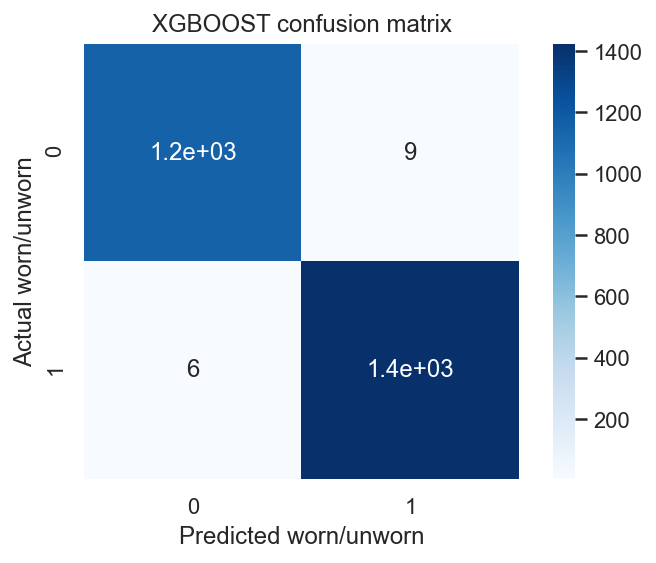

In [68]:
# Accuracy

Accuracy_gbm_train = accuracy_score(y_train, gbm.predict(X_train, ntree_limit=gbm.best_ntree_limit)) 
Accuracy_gbm_test = accuracy_score(y_test, gbm.predict(X_test, ntree_limit=gbm.best_ntree_limit)) 
print("The Accuracy Score for XGBOOST is:")
print("Train: {:6.4f}%".format(100*Accuracy_gbm_train))
print("Test: {:6.4f}%".format(100*Accuracy_gbm_test))


print('\n')
AUC_gbm_score = roc_auc_score(y_test, gbm_pred)
print("The Area Under Curve Score for XGBOOST is:")
print("AUC Score: {:6.4f}%".format(100*AUC_gbm_score))

print('\n')
print("Confusion Matrix for XGBOOST is:")
conf_matrix_gbm = confusion_matrix(y_test, gbm_pred)
print(conf_matrix_gbm)

# Print confusion matrix for xGBOOST
sns.heatmap(conf_matrix_gbm, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])
plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('XGBOOST confusion matrix');

In [69]:
# Precision and recall for default threshold (0.5)

print("Precision: {:6.4f},   Recall: {:6.4f}".format(precision_score(y_test, gbm_pred), 
                                                     recall_score(y_test, gbm_pred)))

Precision: 0.9937,   Recall: 0.9958


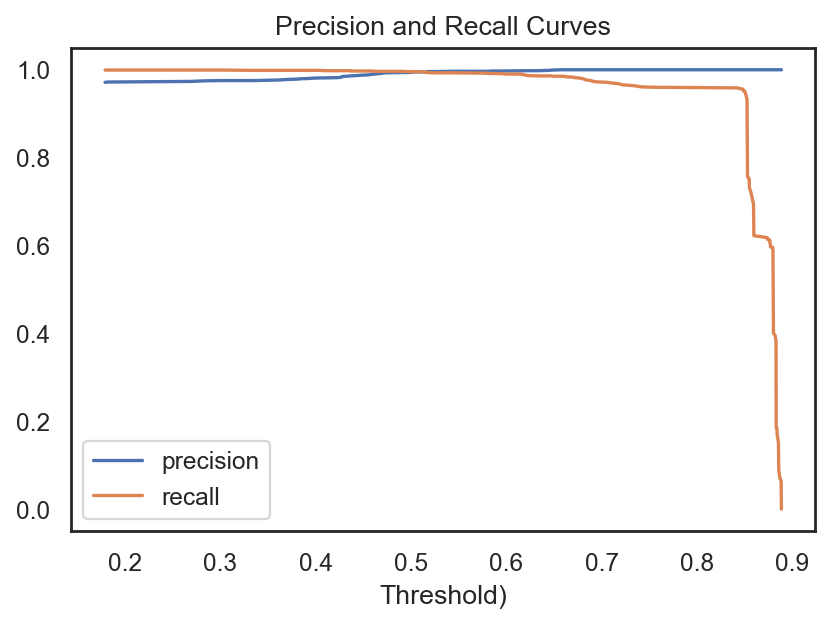

In [70]:
# Recall-Precision trade off

precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_test, gbm.predict_proba(X_test, ntree_limit=gbm.best_ntree_limit)[:,1] )

sns.set_theme(style='white')
plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold)');
plt.title('Precision and Recall Curves');

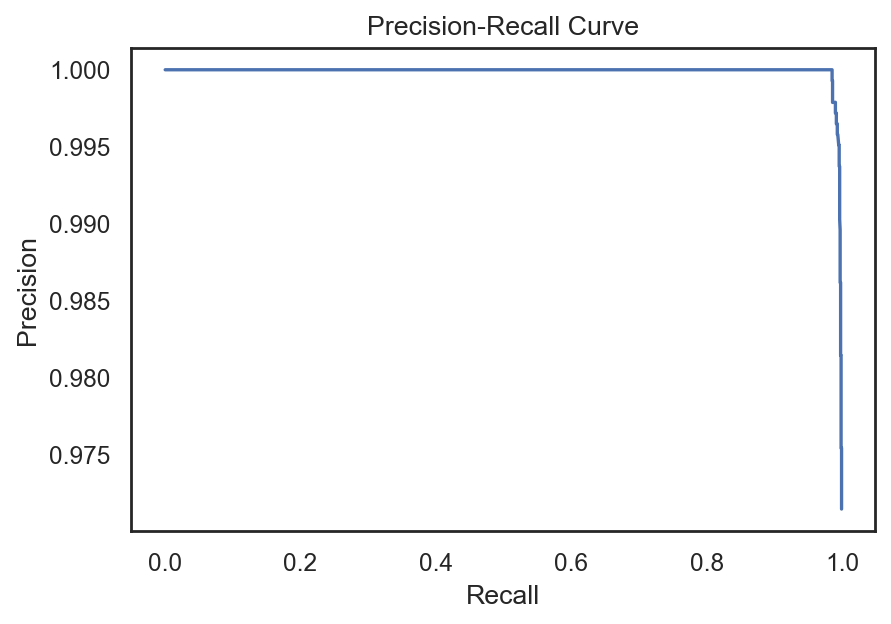

In [71]:
# Precision - Recall curve

sns.set_theme(style='white')
plt.figure(dpi=80)
plt.plot(recall_curve[1:], precision_curve[1:],label='precision')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve");

Threshold of 0.45:
Precision: 0.9875,   Recall: 0.9972
Confusion Matrix for XGBOOST is:
[[1150    9]
 [   6 1424]]


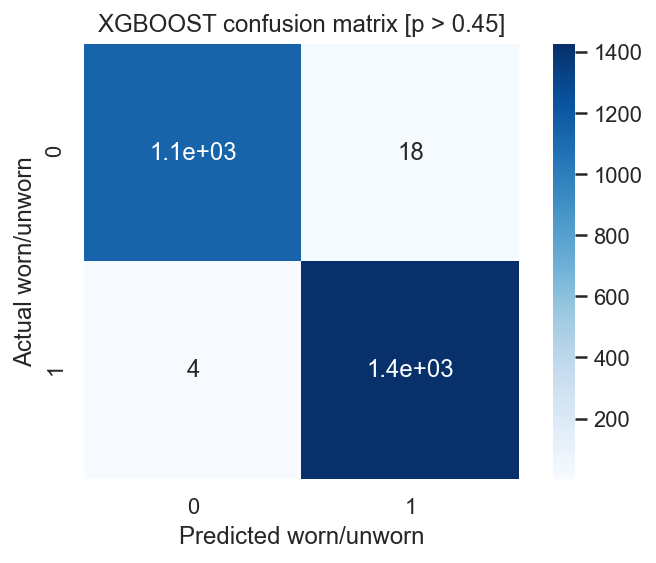

In [81]:
# using the new threshold of 0.45

gbm_pred_2 = (gbm.predict_proba(X_test, ntree_limit=gbm.best_ntree_limit)[:,1] > 0.45 )
print("Threshold of 0.45:")
print("Precision: {:6.4f},   Recall: {:6.4f}".format(precision_score(y_test, gbm_pred_2), 
                                                     recall_score(y_test, gbm_pred_2)))

print("Confusion Matrix for XGBOOST is:")
conf_matrix_gbm2 = confusion_matrix(y_test, gbm_pred_2)
print(conf_matrix_gbm)

# Print confusion matrix for xGBOOST
sns.heatmap(conf_matrix_gbm2, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])
plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('XGBOOST confusion matrix [p > 0.45]');

In [73]:
f1_score(y_test, gbm_pred)

0.9947607404820119

In [74]:
fbeta_score(y_test, gbm_pred, beta=2) # beta = 2 for recall importance, and bata =0.5 for precision importance

0.9953865510974415

In [75]:
# Feature importance 

# xgb.plot_importance(gbm)  # Uses frequency
#xgb.plot_importance(gbm, importance_type='gain') # cummulative information gain from splits done on a feature

#gbm.get_booster().get_score(importance_type='weight') #extract raw frequency scores
gbm.get_booster().get_score(importance_type='gain') #extract raw gain scores

{'Z1_CommandPosition': 209.868409399111,
 'Z1_ActualPosition': 200.1346452676289,
 'X1_DCBusVoltage': 4.069806606176471,
 'Y1_ActualAcceleration': 12.02113742,
 'S1_DCBusVoltage': 4.34453583,
 'Z1_CommandVelocity': 20.4463825,
 'S1_ActualPosition': 13.788108198461536,
 'X1_ActualVelocity': 17.632184979999998,
 'X1_ActualAcceleration': 16.841880094,
 'Z1_ActualAcceleration': 5.2465783642,
 'Y1_OutputCurrent': 17.526889775357137,
 'Z1_ActualVelocity': 29.602273810219362,
 'M1_sequence_number': 7.061189834076923,
 'S1_OutputCurrent': 6.765184699750001,
 'Y1_DCBusVoltage': 1.856301546,
 'X1_OutputPower': 9.731516440000002,
 'Y1_OutputPower': 12.021481598333333,
 'X1_OutputVoltage': 5.791894154000001,
 'S1_CommandPosition': 23.2085857,
 'X1_OutputCurrent': 30.8150222099,
 'Machining_Process': 6.389356146666667,
 'S1_OutputPower': 2.14189911,
 'Y1_ActualVelocity': 3.701858045,
 'M1_CURRENT_FEEDRATE': 6.620275825499999,
 'Y1_OutputVoltage': 0.278064092,
 'S1_ActualAcceleration': 1.25128746,
 

#### Model Comparison

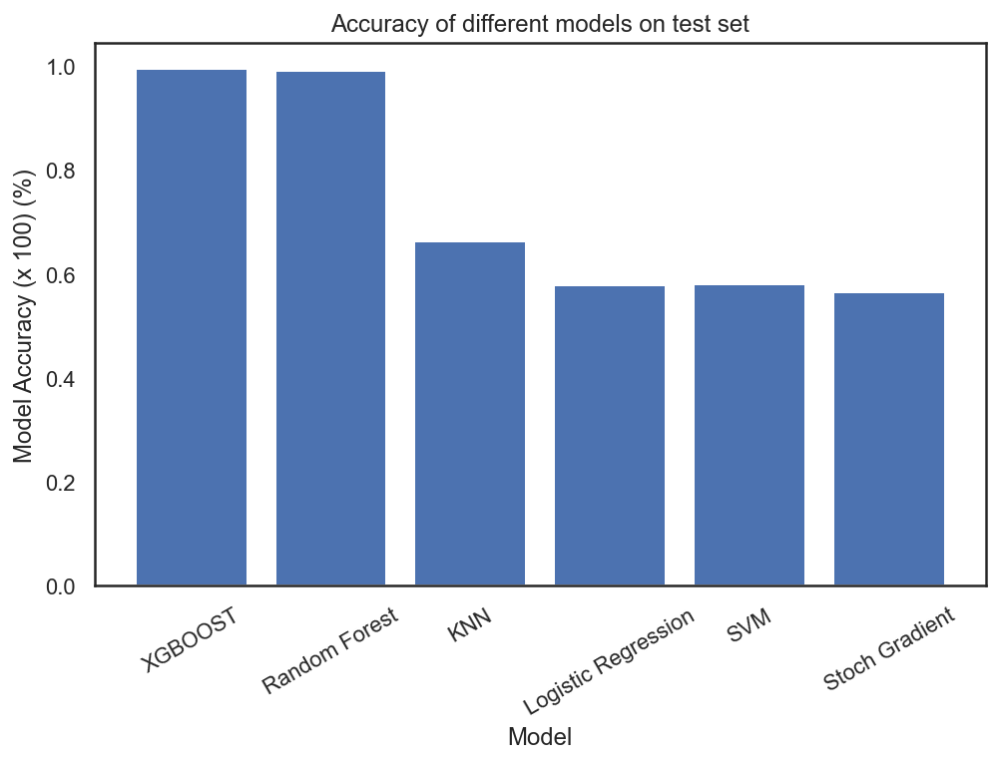

In [76]:
# Comparing accuracy of models on the test dataset

model_name = ['XGBOOST','Random Forest','KNN','Logistic Regression', 'SVM','Stoch Gradient']
Accuracy_test = [Accuracy_gbm_test,Accuracy_rmf_test,Accuracy_knn_test, Accuracy_logreg_test,Accuracy_svm_test,Accuracy_sgd_test]

sns.set_theme(style='white')
#output_percents.plot(kind='bar');
fig, ax = plt.subplots(figsize=(8, 5))
x_index = np.arange(len(model_name))
map_index = model_name
ax.set_xticks(ticks=x_index)    
ax.bar(model_name,Accuracy_test)
ax.set_xlabel('Model')
ax.set_ylabel('Model Accuracy (x 100) (%)')
ax.set_title("Accuracy of different models on test set")
ax.set_xticklabels(map_index,rotation = 30, horizontalalignment = 'center' );

AUC Values are:
XGBOOST: 0.9940
Random Forest: 0.9899
KNN: 0.6621
Logistic Regression: 0.5732
Stochastic Gradient: 0.5530
SVM: 0.5740


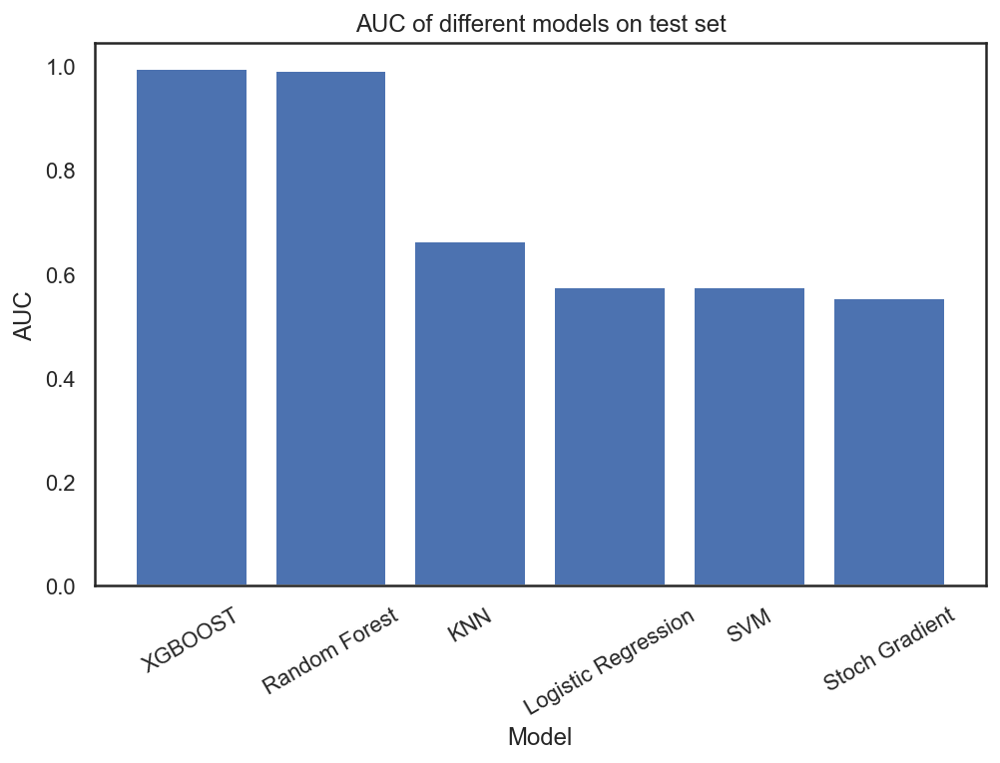

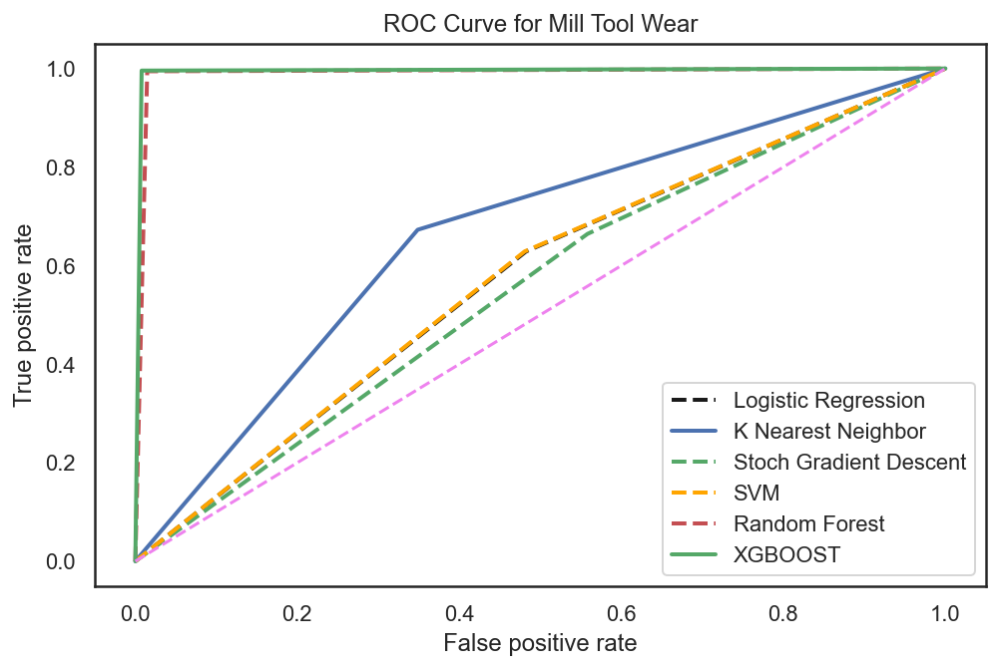

In [77]:
# Area Under Curve for different models

fpr_logreg, tpr_logreg, thresholds_logreg = roc_curve(y_test, logreg_pred)
auc_logreg = auc(fpr_logreg, tpr_logreg)

fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, knn_pred)
auc_knn = auc(fpr_knn, tpr_knn)

fpr_sgd, tpr_sgd, thresholds_sgd = roc_curve(y_test, sgd_pred)
auc_sgd = auc(fpr_sgd, tpr_sgd)

fpr_svm, tpr_svm, thresholds_svm = roc_curve(y_test, svm_pred)
auc_svm = auc(fpr_svm, tpr_svm)

fpr_rmf, tpr_rmf, thresholds_rmf = roc_curve(y_test, rmf_pred)
auc_rmf = auc(fpr_rmf, tpr_rmf)

fpr_gbm, tpr_gbm, thresholds_gbm = roc_curve(y_test, gbm_pred)
auc_gbm = auc(fpr_gbm, tpr_gbm)

# Print AUC values
print("AUC Values are:")
print("XGBOOST: {:6.4f}".format(auc_gbm))
print("Random Forest: {:6.4f}".format(auc_rmf))
print("KNN: {:6.4f}".format(auc_knn))
print("Logistic Regression: {:6.4f}".format(auc_logreg))
print("Stochastic Gradient: {:6.4f}".format(auc_sgd))
print("SVM: {:6.4f}".format(auc_svm))


# Comparing AUC of models on the test dataset

model_name = ['XGBOOST','Random Forest','KNN','Logistic Regression', 'SVM','Stoch Gradient']
AUC_list = [auc_gbm, auc_rmf, auc_knn, auc_logreg,auc_svm, auc_sgd ]

sns.set_theme(style='white')
#output_percents.plot(kind='bar');
fig, ax = plt.subplots(figsize=(8, 5))
x_index = np.arange(len(model_name))
map_index = model_name
ax.set_xticks(ticks=x_index)    
ax.bar(model_name,AUC_list)
ax.set_xlabel('Model')
ax.set_ylabel('AUC')
ax.set_title("AUC of different models on test set")
ax.set_xticklabels(map_index,rotation = 30, horizontalalignment = 'center' );


# Plot Receiver operating characteristic

sns.set_theme(style='white')
fig, ax = plt.subplots(figsize=(8, 5))

plt.plot(fpr_logreg, tpr_logreg, 'k--', lw=2, label='Logistic Regression')
plt.plot(fpr_knn, tpr_knn, 'b-', lw=2, label='K Nearest Neighbor')
plt.plot(fpr_sgd, tpr_sgd, 'g--', lw=2, label='Stoch Gradient Descent')
plt.plot(fpr_svm, tpr_svm, '--', c = 'orange', lw=2, label='SVM')
plt.plot(fpr_rmf, tpr_rmf, 'r--', lw=2, label='Random Forest')
plt.plot(fpr_gbm, tpr_gbm, 'g-', lw=2, label='XGBOOST')

plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve for Mill Tool Wear');
plt.legend(loc="lower right");


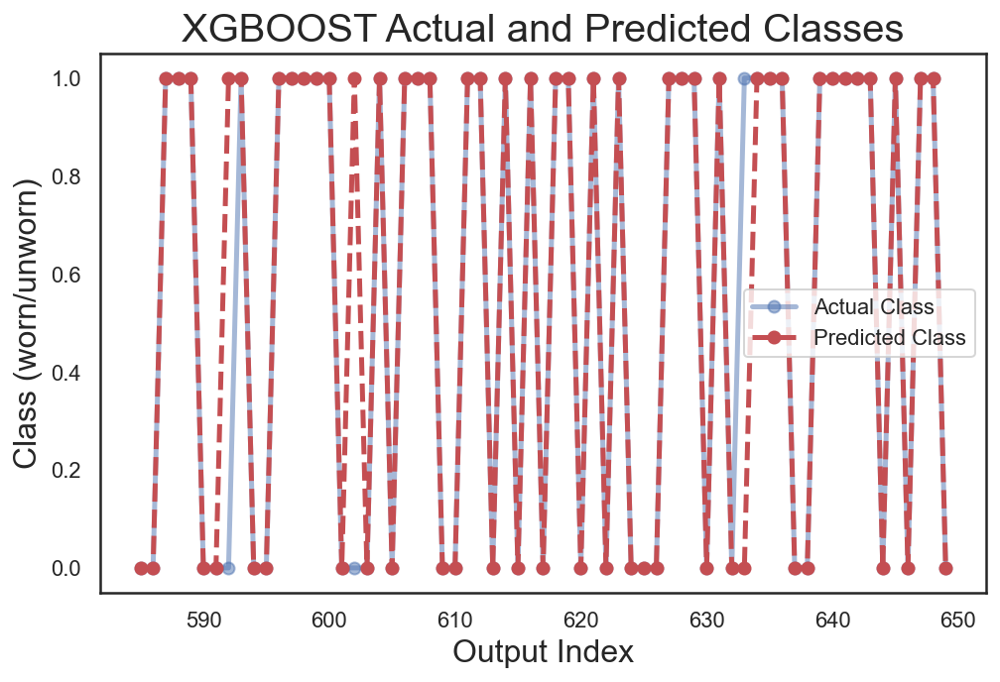

In [78]:
# Plot 50 points of Actual and predicted output values

indx_1 = 585
indx_2 = 650
indx = [i for i in range(indx_1,indx_2)]

sns.set_theme(style='white')
fig, ax = plt.subplots(figsize=(8, 5))

plt.plot(indx,y_test[indx_1:indx_2],    "bo-",  linewidth=2.5, label='Actual Class',    alpha=0.5 )
plt.plot(indx,gbm_pred[indx_1:indx_2], "ro--", linewidth=2.5, label='Predicted Class', alpha=1)
plt.xlabel('Output Index', fontsize=16)            
plt.ylabel('Class (worn/unworn)', fontsize=16) 
plt.title('XGBOOST Actual and Predicted Classes', fontsize=20)     
plt.legend(loc='center right');

In [79]:
# Cross Validation

CV_Scores = cross_val_score(gbm, X_train, y_train, cv=5, scoring = "accuracy")
print("CV_Scores:", CV_Scores,'\n')
print("Mean_CV_Scores:", CV_Scores.mean(),'\n')
print("Standard Deviation of CV_Scores:", CV_Scores.std())

/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:19:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:19:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:20:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' t

[02:20:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Users/amyphillip/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:20:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:20:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:20:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' t

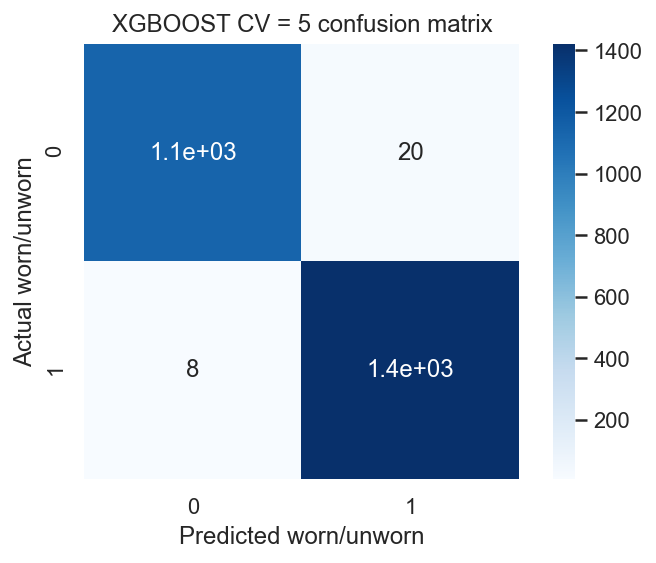

In [80]:
# Confusion Mtrix with cross validation

gbm_cv_pred = cross_val_predict(gbm, X_test, y_test, cv=5)

print("Confusion Matrix for XGBOOST CV is:")
conf_matrix_gbm2 = confusion_matrix(y_test, gbm_cv_pred)
print(conf_matrix_gbm2)

# Print confusion matrix for xGBOOST
sns.heatmap(conf_matrix_gbm2, cmap=plt.cm.Blues, annot=True, square=True) # ,xticklabels=df_X['output'],yticklabels=df_X['output'])
plt.xlabel('Predicted worn/unworn')
plt.ylabel('Actual worn/unworn')
plt.title('XGBOOST CV = 5 confusion matrix');